# P07 : Implémentez un modèle de scoring : Analyse exploratoire 


## Sommaire
- **0 Rapple de la problématique**
- **1 Importer les librairies utiles de Python**
- **2 Télécharger les données**
- **3  Analyse exploratoire du table « application_train»**
    - 3.1.Typage des données 
	- 3.2. Valeurs uniques
	- 3.3. Aperçu sur les valeurs manquantes
	- 3.4. Les valeurs aberrantes 
    - 3.5. Analyse bivariée : variable cible vs les autres variables 
- **4. Analyse exploratoire de « bureau_data »**
- **5. Analyse exploratoire de «previous_application_data »**
- **6. Analyse bivariée : la corrélation entre la variable cible et les autres variables**
	- 6.1. « application_train » 
        - 6.1.1 Corrélation entre l’âge d'un client et le remboursement du prêt
        - 6.1.2. Corrélation entre les "external sources" et le remboursement du prêt
	- 6.2. « credit_card_balance »
	- 6.3. «  installement_payments »
	- 6.4. « previous application »
	- 6.5. « pos_cash_balance »
- **7. Conclusion**

# 0. Rappel de la problématique
-Société financière "Prêt à dépenser" propose des crédits à la consommation pour des personnes ayant peu ou pas d'historique de prêt. 
Dans le but de la prise de  la décision d’accorder ou ne pas accorder un prêt à un client, l’entreprise souhaite développer un modèle de scoring de la probabilité de défaut de paiement du client. 


# 1. Importer les librairies utiles de Pythons

In [181]:
import pandas as pd 
import numpy as np 

import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns 
import missingno as msno
from wordcloud import WordCloud
from collections import Counter

import warnings
warnings.filterwarnings("ignore")

# Modèles de ML
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.dummy import DummyClassifier
from lightgbm import LGBMClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import ElasticNet

# Transformations de variables
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, RobustScaler, MinMaxScaler
from sklearn.impute import SimpleImputer
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer, make_column_selector, make_column_transformer

import os

In [2]:
pd.options.display.max_rows = 1000
pd.options.display.max_columns = 1000

In [7]:
# Set colors pour afficher
class color:
    PURPLE = '\033[95m'
    CYAN = '\033[96m'
    DARKCYAN = '\033[36m'
    BLUE = '\033[94m'
    GREEN = '\033[92m'
    YELLOW = '\033[93m'
    RED = '\033[91m'
    BOLD = '\033[1m'
    UNDERLINE = '\033[4m'
    END = '\033[0m'

# 2. Télécharger les données 

- Le jeu de données contient 8 tables : 
- **HomeCredit_columns_description** : definitions of all the columns in data set

- **application_train/application_test**: the main training and testing data with information about each loan application at Home Credit. Every loan has its own row and is identified by the feature SK_ID_CURR. The training application data comes with the TARGET indicating 0: the loan was repaid or 1: the loan was not repaid.
- **bureau**: data concerning client's previous credits from other financial institutions. Each previous credit has its own row in bureau, but one loan in the application data can have multiple previous credits.
- **bureau_balance**: monthly data about the previous credits in bureau. Each row is one month of a previous credit, and a single previous credit can have multiple rows, one for each month of the credit length.
- **previous_application**: previous applications for loans at Home Credit of clients who have loans in the application data. Each current loan in the application data can have multiple previous loans. Each previous application has one row and is identified by the feature SK_ID_PREV.
- **POS_CASH_BALANCE**: monthly data about previous point of sale or cash loans clients have had with Home Credit. Each row is one month of a previous point of sale or cash loan, and a single previous loan can have many rows.
- **credit_card_balance**: monthly data about previous credit cards clients have had with Home Credit. Each row is one month of a credit card balance, and a single credit card can have many rows.
- **installments_payment**: payment history for previous loans at Home Credit. There is one row for every made payment and one row for every missed payment.

In [8]:
print(color.BOLD + color.BLUE + 'CHECKLIST DATA EXPLORER :\n'+ color.END)
display(os.listdir(r"C:\Users\faeze\OneDrive\Documents\OC data science\PROJECT\Projet 7\Projet+Mise+en+prod+-+home-credit-default-risk"))

CHECKLIST DATA EXPLORER :



['application_test.csv',
 'application_train.csv',
 'bureau.csv',
 'bureau_balance.csv',
 'credit_card_balance.csv',
 'HomeCredit_columns_description.csv',
 'installments_payments.csv',
 'POS_CASH_balance.csv',
 'previous_application.csv',
 'sample_submission.csv']

In [9]:
application_train = pd.read_csv(r"C:\Users\faeze\OneDrive\Documents\OC data science\PROJECT\Projet 7\Projet+Mise+en+prod+-+home-credit-default-risk\application_train.csv")
application_test = pd.read_csv(r'C:\Users\faeze\OneDrive\Documents\OC data science\PROJECT\Projet 7\Projet+Mise+en+prod+-+home-credit-default-risk\application_test.csv')
bureau = pd.read_csv(r"C:\Users\faeze\OneDrive\Documents\OC data science\PROJECT\Projet 7\Projet+Mise+en+prod+-+home-credit-default-risk\bureau.csv")
bureau_balance = pd.read_csv(r"C:\Users\faeze\OneDrive\Documents\OC data science\PROJECT\Projet 7\Projet+Mise+en+prod+-+home-credit-default-risk\bureau_balance.csv")
credit_card_balance = pd.read_csv(r"C:\Users\faeze\OneDrive\Documents\OC data science\PROJECT\Projet 7\Projet+Mise+en+prod+-+home-credit-default-risk\credit_card_balance.csv")
installments_payments = pd.read_csv(r"C:\Users\faeze\OneDrive\Documents\OC data science\PROJECT\Projet 7\Projet+Mise+en+prod+-+home-credit-default-risk\installments_payments.csv")
HomeCredit_columns_description = pd.read_csv(r"C:\Users\faeze\OneDrive\Documents\OC data science\PROJECT\Projet 7\Projet+Mise+en+prod+-+home-credit-default-risk\HomeCredit_columns_description.csv")
POS_CASH_balance = pd.read_csv(r"C:\Users\faeze\OneDrive\Documents\OC data science\PROJECT\Projet 7\Projet+Mise+en+prod+-+home-credit-default-risk\POS_CASH_balance.csv")
previous_application = pd.read_csv(r"C:\Users\faeze\OneDrive\Documents\OC data science\PROJECT\Projet 7\Projet+Mise+en+prod+-+home-credit-default-risk\previous_application.csv")
sample_submission = pd.read_csv(r"C:\Users\faeze\OneDrive\Documents\OC data science\PROJECT\Projet 7\Projet+Mise+en+prod+-+home-credit-default-risk\sample_submission.csv")                                  

In [10]:
print(color.BOLD + color.RED + 'DOCUMENTATION :\n'+ color.END)
HomeCredit_columns_description

DOCUMENTATION :



,Unnamed: 0,Table,Row,Description,Special
0,1,application_{train|test}.csv,SK_ID_CURR,ID of loan in our sample,NaN
1,2,application_{train|test}.csv,TARGET,Target variable (1 - client with payment diffi...,NaN
2,5,application_{train|test}.csv,NAME_CONTRACT_TYPE,Identification if loan is cash or revolving,NaN
3,6,application_{train|test}.csv,CODE_GENDER,Gender of the client,NaN
4,7,application_{train|test}.csv,FLAG_OWN_CAR,Flag if the client owns a car,NaN
5,8,application_{train|test}.csv,FLAG_OWN_REALTY,Flag if client owns a house or flat,NaN
6,9,application_{train|test}.csv,CNT_CHILDREN,Number of children the client has,NaN
7,10,application_{train|test}.csv,AMT_INCOME_TOTAL,Income of the client,NaN
8,11,application_{train|test}.csv,AMT_CREDIT,Credit amount of the loan,NaN
9,12,application_{train|test}.csv,AMT_ANNUITY,Loan annuity,NaN


In [18]:
print(color.BOLD + color.RED + "application_train -"+ color.END,'rows:',application_train.shape[0]," columns:", application_train.shape[1])
print(color.BOLD + color.BLUE + "application_test -"+ color.END, 'rows', application_test.shape[0]," columns:", application_test.shape[1])
print(color.BOLD + color.RED + "bureau "+ color.END,'rows:',bureau.shape[0]," columns:", bureau.shape[1])
print(color.BOLD + color.BLUE + "bureau_balance - "+ color.END,'rows:',bureau_balance.shape[0]," columns:", bureau_balance.shape[1])
print(color.BOLD + color.RED + "credit_card_balance - "+ color.END,'rows:',credit_card_balance.shape[0]," columns:", credit_card_balance.shape[1])
print(color.BOLD + color.BLUE + "installments_payments - "+ color.END,'rows:',installments_payments.shape[0]," columns:", installments_payments.shape[1])
print(color.BOLD + color.RED + "previous_application - "+ color.END,'rows:',previous_application.shape[0]," columns:", previous_application.shape[1])
print(color.BOLD + color.BLUE + "POS_CASH_balance - "+ color.END,'rows:',POS_CASH_balance.shape[0], "columns:", POS_CASH_balance.shape[1])

application_train - rows: 307511  columns: 122
application_test - rows 48744  columns: 121
bureau  rows: 1716428  columns: 17
bureau_balance -  rows: 27299925  columns: 3
credit_card_balance -  rows: 3840312  columns: 23
installments_payments -  rows: 13605401  columns: 8
previous_application -  rows: 1670214  columns: 37
POS_CASH_balance -  rows: 10001358 columns: 8


# 3.Analyse exploratoire du table « application_train»

In [19]:
print(application_train.shape)
for j in application_train.columns:
    print(j.capitalize())
    print('Number of Unique values:',application_train[j].nunique())
    print("Value Count of ",j.capitalize())
    print(application_train[j].value_counts())
    print("")
    print("**********************************************************************************")
    print("")

(307511, 122)
Sk_id_curr
Number of Unique values: 307511
Value Count of  Sk_id_curr
100401    1
239070    1
243164    1
230874    1
237017    1
         ..
154398    1
148253    1
150300    1
160539    1
100303    1
Name: SK_ID_CURR, Length: 307511, dtype: int64

**********************************************************************************

Target
Number of Unique values: 2
Value Count of  Target
0    282686
1     24825
Name: TARGET, dtype: int64

**********************************************************************************

Name_contract_type
Number of Unique values: 2
Value Count of  Name_contract_type
Cash loans         278232
Revolving loans     29279
Name: NAME_CONTRACT_TYPE, dtype: int64

**********************************************************************************

Code_gender
Number of Unique values: 3
Value Count of  Code_gender
F      202448
M      105059
XNA         4
Name: CODE_GENDER, dtype: int64

************************************************************

2.0     158357
1.0      67847
3.0      52601
4.0      24697
5.0       3478
6.0        408
7.0         81
8.0         20
9.0          6
10.0         3
16.0         2
14.0         2
20.0         2
12.0         2
15.0         1
11.0         1
13.0         1
Name: CNT_FAM_MEMBERS, dtype: int64

**********************************************************************************

Region_rating_client
Number of Unique values: 3
Value Count of  Region_rating_client
2    226984
3     48330
1     32197
Name: REGION_RATING_CLIENT, dtype: int64

**********************************************************************************

Region_rating_client_w_city
Number of Unique values: 3
Value Count of  Region_rating_client_w_city
2    229484
3     43860
1     34167
Name: REGION_RATING_CLIENT_W_CITY, dtype: int64

**********************************************************************************

Weekday_appr_process_start
Number of Unique values: 7
Value Count of  Weekday_appr_process_start
TUESDAY     

Number of Unique values: 257
Value Count of  Elevators_avg
0.0000    85718
0.0800     9886
0.1600     8806
0.2400     6071
0.1200     5593
0.0400     4585
0.2000     4072
0.3200     2788
0.2800     2272
0.4000     1532
0.3600     1383
0.4800     1069
0.4400      707
0.1000      520
0.5600      483
0.6400      448
0.0600      424
0.0200      423
0.1400      369
0.5200      280
0.1800      258
0.1064      257
0.6000      248
0.1332      234
0.0532      225
0.7200      222
0.2200      221
0.0264      208
1.0000      158
0.0932      147
0.2600      143
0.0664      139
0.2132      131
0.8000      129
0.1864      124
0.6800      116
0.3000      107
0.3400      102
0.0132       99
0.1464       98
0.1732       85
0.9600       81
0.3800       77
0.0900       76
0.2664       75
0.2264       68
0.8800       68
0.1100       68
0.0160       64
0.3732       64
0.0640       61
0.0500       58
0.0960       57
0.2932       55
0.0700       50
0.1120       48
0.7600       45
0.3464       42
0.0320       

Number of Unique values: 760
Value Count of  Apartments_mode
0.0840    7522
0.0630    7451
0.0945    4757
0.0735    4388
0.0084    3970
0.0168    3324
0.1050    3116
0.1513    3039
0.0126    3034
0.0756    2973
0.1261    2372
0.1134    2154
0.0189    1960
0.0252    1951
0.0672    1838
0.0420    1785
0.0378    1741
0.0504    1718
0.1250    1658
0.2269    1500
0.0788    1325
0.0315    1148
0.0336    1121
0.0284    1101
0.0588    1072
0.0042    1069
0.1891    1033
0.0021    1006
0.0000     976
0.0830     974
0.1008     954
0.1502     951
0.0714     933
0.0746     882
0.1681     872
0.0819     868
0.0725     855
0.0567     842
0.0620     805
0.1029     780
0.0525     753
0.0935     746
0.2258     732
0.0882     731
0.0609     695
0.0851     677
0.1345     674
0.1355     661
0.1040     661
0.1155     643
0.0693     625
0.0473     623
0.0798     609
0.0683     599
0.0231     592
0.1103     553
0.0924     549
0.1239     546
0.0210     536
0.0641     535
0.1471     512
0.0578     503
0.1124   

0.0000    67126
0.0011      477
0.0046      466
0.0033      430
0.0012      427
          ...  
0.6694        1
0.2877        1
0.3061        1
0.4175        1
0.2379        1
Name: NONLIVINGAREA_MODE, Length: 3327, dtype: int64

**********************************************************************************

Apartments_medi
Number of Unique values: 1148
Value Count of  Apartments_medi
0.0833    7109
0.0625    6687
0.0937    4622
0.0729    4211
0.0083    3562
          ... 
0.6527       1
0.3180       1
0.8286       1
0.5439       1
0.7422       1
Name: APARTMENTS_MEDI, Length: 1148, dtype: int64

**********************************************************************************

Basementarea_medi
Number of Unique values: 3772
Value Count of  Basementarea_medi
0.0000    14991
0.0818      271
0.1091      266
0.0545      265
0.0727      248
          ...  
0.2838        1
0.5178        1
0.3087        1
0.7689        1
0.3139        1
Name: BASEMENTAREA_MEDI, Length: 3772, dtype: int6

Number of Unique values: 4
Value Count of  Fondkapremont_mode
reg oper account         73830
reg oper spec account    12080
not specified             5687
org spec account          5619
Name: FONDKAPREMONT_MODE, dtype: int64

**********************************************************************************

Housetype_mode
Number of Unique values: 3
Value Count of  Housetype_mode
block of flats      150503
specific housing      1499
terraced house        1212
Name: HOUSETYPE_MODE, dtype: int64

**********************************************************************************

Totalarea_mode
Number of Unique values: 5116
Value Count of  Totalarea_mode
0.0000    582
0.0570    247
0.0547    230
0.0548    227
0.0555    227
         ... 
0.7580      1
0.6462      1
0.3976      1
0.4634      1
0.5383      1
Name: TOTALAREA_MODE, Length: 5116, dtype: int64

**********************************************************************************

Wallsmaterial_mode
Number of Unique values: 7
Value 

Number of Unique values: 11
Value Count of  Amt_req_credit_bureau_qrt
0.0      215417
1.0       33862
2.0       14412
3.0        1717
4.0         476
5.0          64
6.0          28
8.0           7
7.0           7
19.0          1
261.0         1
Name: AMT_REQ_CREDIT_BUREAU_QRT, dtype: int64

**********************************************************************************

Amt_req_credit_bureau_year
Number of Unique values: 25
Value Count of  Amt_req_credit_bureau_year
0.0     71801
1.0     63405
2.0     50192
3.0     33628
4.0     20714
5.0     12052
6.0      6967
7.0      3869
8.0      2127
9.0      1096
11.0       31
12.0       30
10.0       22
13.0       19
14.0       10
17.0        7
15.0        6
18.0        4
19.0        4
16.0        3
25.0        1
21.0        1
22.0        1
20.0        1
23.0        1
Name: AMT_REQ_CREDIT_BUREAU_YEAR, dtype: int64

**********************************************************************************



In [13]:
app_train_desc = HomeCredit_columns_description[HomeCredit_columns_description["Table"]== 'application_{train|test}.csv']


## 3.1.Typage de dnnées 

In [14]:
#Nombre des differents typage des feautures
application_train.dtypes.value_counts()

float64    65
int64      41
object     16
dtype: int64

## 3.2. Valeurs Uniques

In [15]:
#valuers uniques des variables categorielles 
cat_var_df = pd.DataFrame(application_train.select_dtypes('object').nunique())
cat_var_df.reset_index(inplace = True)
categ_variable_list = cat_var_df['index'].tolist()
cat_var_df.columns = ['var', 'unique_value']
cat_var_df.sort_values(by ='unique_value', ascending = False)

,var,unique_value
11,ORGANIZATION_TYPE,58
9,OCCUPATION_TYPE,18
5,NAME_INCOME_TYPE,8
4,NAME_TYPE_SUITE,7
10,WEEKDAY_APPR_PROCESS_START,7
14,WALLSMATERIAL_MODE,7
7,NAME_FAMILY_STATUS,6
8,NAME_HOUSING_TYPE,6
6,NAME_EDUCATION_TYPE,5
12,FONDKAPREMONT_MODE,4


In [16]:
#valuers uniques des variables numériques
num_var_df = pd.DataFrame(application_train.select_dtypes(include=np.number).nunique())
num_var_df.reset_index(inplace = True)

numerical_variable_list = num_var_df['index'].tolist()
num_var_df.columns = ['var', 'unique_value']
num_var_df.sort_values(by ='unique_value', ascending = False)

,var,unique_value
0,SK_ID_CURR,307511
30,EXT_SOURCE_2,119831
29,EXT_SOURCE_1,114584
8,DAYS_BIRTH,17460
10,DAYS_REGISTRATION,15688
5,AMT_ANNUITY,13672
9,DAYS_EMPLOYED,12574
11,DAYS_ID_PUBLISH,6168
4,AMT_CREDIT,5603
57,LIVINGAREA_MODE,5301


In [17]:
unique_df = pd.DataFrame(application_train.select_dtypes('object').nunique()).reset_index()
unique_df.columns = ['Column','No. of Unique Values']

## extract the unique classes in each column
unique_df['Unique Values'] = unique_df['Column'].apply(lambda x: application_train[x].unique())
unique_df.sort_values(by='No. of Unique Values')

,Column,No. of Unique Values,Unique Values
0,NAME_CONTRACT_TYPE,2,"[Cash loans, Revolving loans]"
2,FLAG_OWN_CAR,2,"[N, Y]"
3,FLAG_OWN_REALTY,2,"[Y, N]"
15,EMERGENCYSTATE_MODE,2,"[No, nan, Yes]"
1,CODE_GENDER,3,"[M, F, XNA]"
13,HOUSETYPE_MODE,3,"[block of flats, nan, terraced house, specific..."
12,FONDKAPREMONT_MODE,4,"[reg oper account, nan, org spec account, reg ..."
6,NAME_EDUCATION_TYPE,5,"[Secondary / secondary special, Higher educati..."
7,NAME_FAMILY_STATUS,6,"[Single / not married, Married, Civil marriage..."
8,NAME_HOUSING_TYPE,6,"[House / apartment, Rented apartment, With par..."


**La plupart des variables catégorielles ont un nombre relativement petit d'entrées uniques. Nous devrons trouver un moyen de traiter ces variables catégorielles…**

In [18]:
#valuers uniques des variables numériques
num_var_df = pd.DataFrame(application_train.select_dtypes(include=np.number).nunique())
num_var_df.reset_index(inplace = True)

numerical_variable_list = num_var_df['index'].tolist()
num_var_df.columns = ['var', 'unique_value']
num_var_df.sort_values(by ='unique_value', ascending = False)

,var,unique_value
0,SK_ID_CURR,307511
30,EXT_SOURCE_2,119831
29,EXT_SOURCE_1,114584
8,DAYS_BIRTH,17460
10,DAYS_REGISTRATION,15688
5,AMT_ANNUITY,13672
9,DAYS_EMPLOYED,12574
11,DAYS_ID_PUBLISH,6168
4,AMT_CREDIT,5603
57,LIVINGAREA_MODE,5301


## 3.3 Aperçu sur les valeurs manquantes

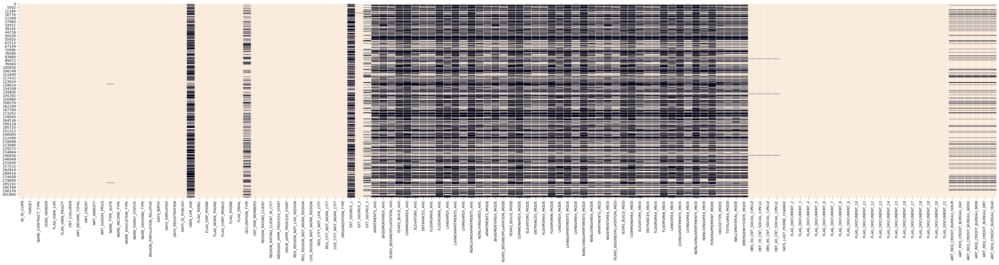

In [19]:
# Vue global sur les valeurs manquantes
plt.figure(figsize=(50,10))
sns.heatmap(application_train.notna(), cbar=False)

plt.show()

In [20]:
def missing_data(data):
    
    total = data.isnull().sum().sort_values(ascending=False)
    percent = (data.isnull().sum()/data.isnull().count()*100)\
        .sort_values(ascending=False)
    return pd.concat([total, percent],
                     axis=1,
                     keys=['Total', 'Percent'])


In [21]:
def plot_simple_barplot(x, y, x_lab=None, y_lab=None, title=None,
                        shorten_label=15, figsize=(25, 3), color=None,
                        annotate=False):

    #color = None if color is None else colors.get_named_colors_mapping()[color]

    fig = plt.figure(figsize=(20, 10))
    sns.barplot(x=x, y=y, ec='k', color='red')

    plt.xticks(rotation=45, ha='right')
    ax = plt.gca()
    ax.set_ylabel(y_lab)
    ax.set_xlabel(x_lab)
    ax.set_title(title,
                 fontweight='bold', pad=15)

    if shorten_label:
        thr = int(shorten_label)
        lab_x = [item.get_text() for item in ax.get_xticklabels()]
        short_lab_x = [s[:thr] + '...' + s[-thr:] if len(s) > 2*thr else s for s in lab_x]
        ax.axes.set_xticklabels(short_lab_x)

    if annotate:
        for i, val in enumerate(y):
            ymin, ymax = ax.get_ylim()
            plt.text(i-0.25, val+(ymax-ymin)*1/30, f'{val}')  # fontsize=10)
            ax.set(ylim=(ymin, ymax+(ymax-ymin)*0.005))

    plt.grid()


In [22]:
# Have a overview of the missing values

df_miss = missing_data(application_train)

df_miss.head(20)

,Total,Percent
COMMONAREA_MEDI,214865,69.872297
COMMONAREA_AVG,214865,69.872297
COMMONAREA_MODE,214865,69.872297
NONLIVINGAPARTMENTS_MODE,213514,69.432963
NONLIVINGAPARTMENTS_AVG,213514,69.432963
NONLIVINGAPARTMENTS_MEDI,213514,69.432963
FONDKAPREMONT_MODE,210295,68.386172
LIVINGAPARTMENTS_MODE,210199,68.354953
LIVINGAPARTMENTS_AVG,210199,68.354953
LIVINGAPARTMENTS_MEDI,210199,68.354953


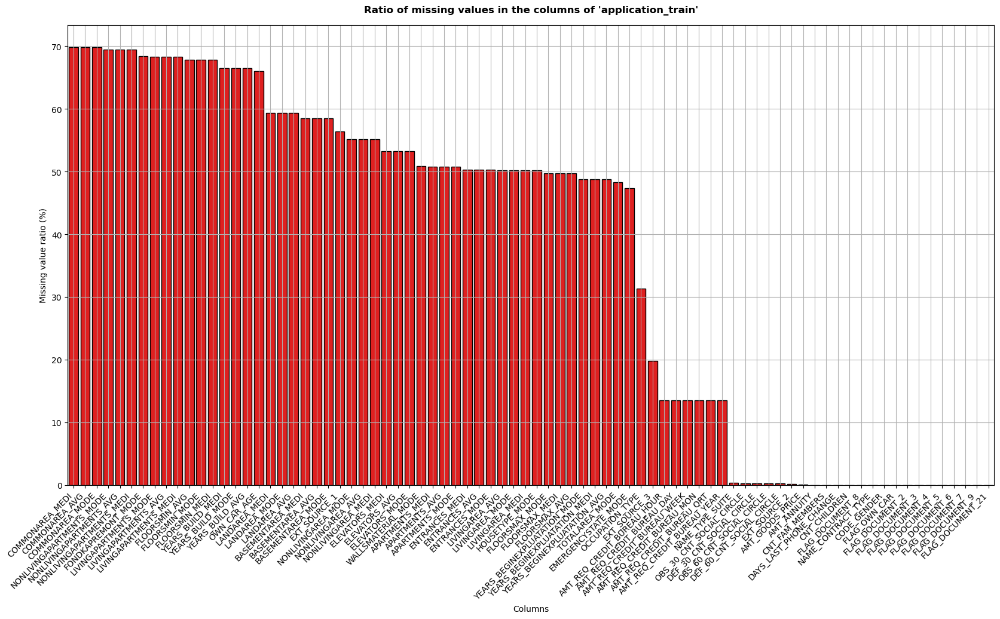

In [29]:
plot_simple_barplot(x = df_miss.index[:80],
                    y = df_miss['Percent'].iloc[:80],
                    x_lab='Columns', y_lab='Missing value ratio (%)',
                    title="Ratio of missing values in the columns of 'application_train'",
                    shorten_label=15, figsize=(25,3), color='lightgrey')

In [25]:
# function pour vérifier les valeurs manquantes
def nan(df):
    
    total_nan = df.isnull().sum()
    percent_1 = df.isnull().sum()/df.isnull().count()*100
    ercent_2 = (np.round(percent_1, 2))
    missing_data = pd.concat([total_nan, percent_1], 
                             axis=1, keys=['Total_nan', 'pourcentage']).sort_values('pourcentage'
                                                                , ascending=False)
    return missing_data


### Valeur manquantes variables categorielles 

In [26]:
# Valeur manquantes variables categorielle 


print("Nb des variables : " + str(len(nan(application_train[categ_variable_list]))))

print("Nb des varaibles categorielles avec valeurs manquantes: " + 
      str(len(nan(application_train[categ_variable_list])[nan(application_train[categ_variable_list])['Total_nan']!=0])))


nan(application_train[categ_variable_list])[:6]

Nb des variables : 16
Nb des varaibles categorielles avec valeurs manquantes: 6


,Total_nan,pourcentage
FONDKAPREMONT_MODE,210295,68.386172
WALLSMATERIAL_MODE,156341,50.840783
HOUSETYPE_MODE,154297,50.176091
EMERGENCYSTATE_MODE,145755,47.398304
OCCUPATION_TYPE,96391,31.345545
NAME_TYPE_SUITE,1292,0.420148


### Valeur manquantes variables numeriques

In [28]:
# Valeur manquantes variables numerique

print("Nb des variables : " + str(len(nan(application_train[numerical_variable_list]))))

print("Nb des varaibles numerique avec valeurs manquantes: " + 
      str(len(nan(application_train[numerical_variable_list])[nan(application_train[numerical_variable_list])['Total_nan']!=0])))

nan(application_train[numerical_variable_list])[:10]

Nb des variables : 106
Nb des varaibles numerique avec valeurs manquantes: 61


,Total_nan,pourcentage
COMMONAREA_MODE,214865,69.872297
COMMONAREA_AVG,214865,69.872297
COMMONAREA_MEDI,214865,69.872297
NONLIVINGAPARTMENTS_AVG,213514,69.432963
NONLIVINGAPARTMENTS_MODE,213514,69.432963
NONLIVINGAPARTMENTS_MEDI,213514,69.432963
LIVINGAPARTMENTS_MODE,210199,68.354953
LIVINGAPARTMENTS_AVG,210199,68.354953
LIVINGAPARTMENTS_MEDI,210199,68.354953
FLOORSMIN_MEDI,208642,67.848630


In [29]:
columns = application_train.isnull().sum()[application_train.isnull().sum() != 0].keys()
nans_count = application_train.isnull().sum()[application_train.isnull().sum() != 0].values
nans_percentage = application_train.isnull().sum()[application_train.isnull().sum() != 0].values/application_train.shape[0]

In [30]:
# create a dataframe from the extracted info. 
nans_df = pd.DataFrame({'Column':columns, 'No. of NaNs':nans_count, '% of NaNs in Column':nans_percentage*100})
nans_df = nans_df.sort_values(by='% of NaNs in Column', ascending=False)
nans_df


,Column,No. of NaNs,% of NaNs in Column
41,COMMONAREA_MEDI,214865,69.872297
13,COMMONAREA_AVG,214865,69.872297
27,COMMONAREA_MODE,214865,69.872297
49,NONLIVINGAPARTMENTS_MEDI,213514,69.432963
35,NONLIVINGAPARTMENTS_MODE,213514,69.432963
21,NONLIVINGAPARTMENTS_AVG,213514,69.432963
51,FONDKAPREMONT_MODE,210295,68.386172
33,LIVINGAPARTMENTS_MODE,210199,68.354953
47,LIVINGAPARTMENTS_MEDI,210199,68.354953
19,LIVINGAPARTMENTS_AVG,210199,68.354953


## 3.4. Les valeurs aberrantes 

In [31]:
# extract continuous columns
all_numerical_cols = list(application_train.select_dtypes(exclude='object').columns)

# continuous  columns are all columns excluding target and flags columns
cont_cols = [col for col in all_numerical_cols if col!="TARGET" and col[:5]!='FLAG_']
print(f'No. of continuous features = {len(cont_cols)}')

No. of continuous features = 79


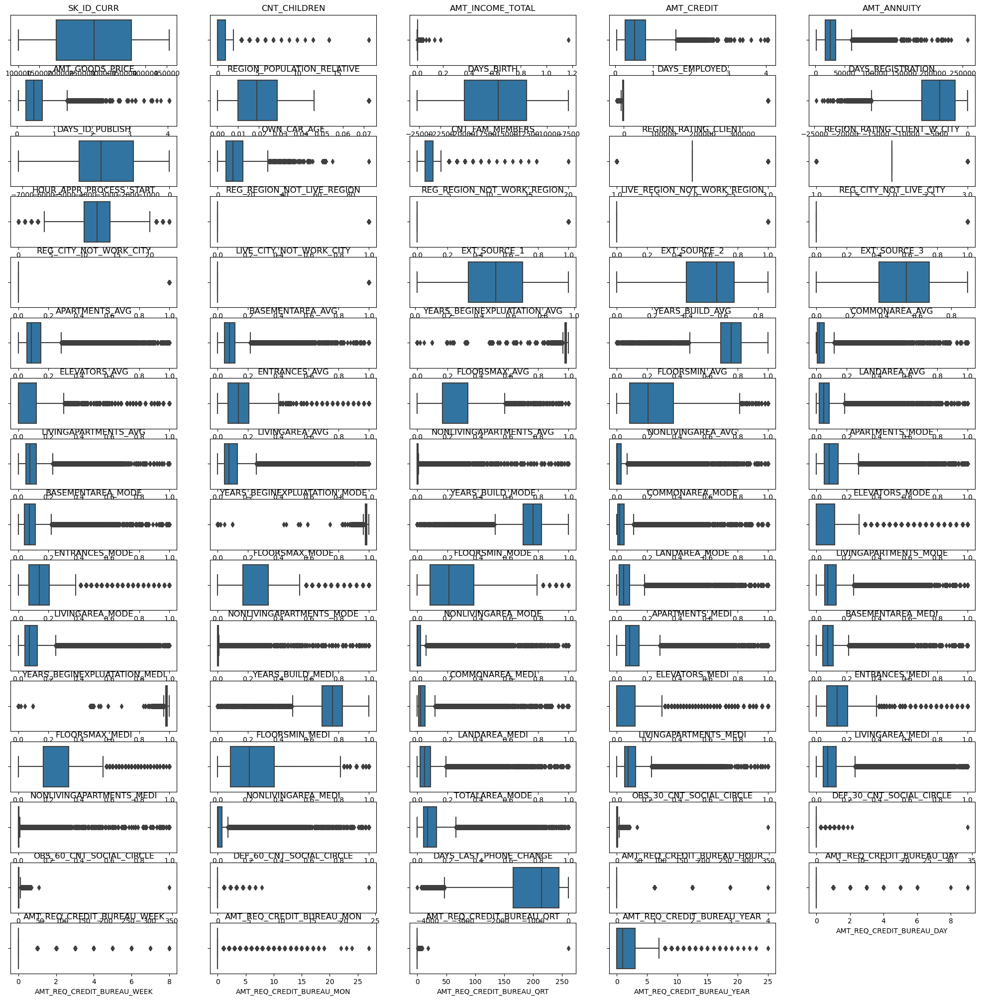

In [32]:
# draw boxplots for each continuous column
plt.figure(figsize=(25, 25))
for i, col in enumerate(cont_cols):
    plt.subplot(16, 5, i+1)
    sns.boxplot(data=application_train, x=col)
    plt.title(col)

In [33]:
# let's go deeper in these columns
## show only 20 columns at a time
for i in np.linspace(0,60,4, dtype=int):
    if i == 60:
        display(application_train[cont_cols[i:78]].describe())
    else:
        display(application_train[cont_cols[i:i+20]].describe())

,SK_ID_CURR,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY
count,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,104582.000000,307509.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000
mean,278180.518577,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,-4986.120328,-2994.202373,12.061091,2.152665,2.052463,2.031521,12.063419,0.015144,0.050769,0.040659,0.078173
std,102790.175348,0.722121,2.371231e+05,4.024908e+05,14493.737315,3.694465e+05,0.013831,4363.988632,141275.766519,3522.886321,1509.450419,11.944812,0.910682,0.509034,0.502737,3.265832,0.122126,0.219526,0.197499,0.268444
min,100002.000000,0.000000,2.565000e+04,4.500000e+04,1615.500000,4.050000e+04,0.000290,-25229.000000,-17912.000000,-24672.000000,-7197.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,189145.500000,0.000000,1.125000e+05,2.700000e+05,16524.000000,2.385000e+05,0.010006,-19682.000000,-2760.000000,-7479.500000,-4299.000000,5.000000,2.000000,2.000000,2.000000,10.000000,0.000000,0.000000,0.000000,0.000000
50%,278202.000000,0.000000,1.471500e+05,5.135310e+05,24903.000000,4.500000e+05,0.018850,-15750.000000,-1213.000000,-4504.000000,-3254.000000,9.000000,2.000000,2.000000,2.000000,12.000000,0.000000,0.000000,0.000000,0.000000
75%,367142.500000,1.000000,2.025000e+05,8.086500e+05,34596.000000,6.795000e+05,0.028663,-12413.000000,-289.000000,-2010.000000,-1720.000000,15.000000,3.000000,2.000000,2.000000,14.000000,0.000000,0.000000,0.000000,0.000000
max,456255.000000,19.000000,1.170000e+08,4.050000e+06,258025.500000,4.050000e+06,0.072508,-7489.000000,365243.000000,0.000000,0.000000,91.000000,20.000000,3.000000,3.000000,23.000000,1.000000,1.000000,1.000000,1.000000


,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE
count,307511.000000,307511.000000,134133.000000,3.068510e+05,246546.000000,151450.00000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000
mean,0.230454,0.179555,0.502130,5.143927e-01,0.510853,0.11744,0.088442,0.977735,0.752471,0.044621,0.078942,0.149725,0.226282,0.231894,0.066333,0.100775,0.107399,0.008809,0.028358,0.114231
std,0.421124,0.383817,0.211062,1.910602e-01,0.194844,0.10824,0.082438,0.059223,0.113280,0.076036,0.134576,0.100049,0.144641,0.161380,0.081184,0.092576,0.110565,0.047732,0.069523,0.107936
min,0.000000,0.000000,0.014568,8.173617e-08,0.000527,0.00000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.334007,3.924574e-01,0.370650,0.05770,0.044200,0.976700,0.687200,0.007800,0.000000,0.069000,0.166700,0.083300,0.018700,0.050400,0.045300,0.000000,0.000000,0.052500
50%,0.000000,0.000000,0.505998,5.659614e-01,0.535276,0.08760,0.076300,0.981600,0.755200,0.021100,0.000000,0.137900,0.166700,0.208300,0.048100,0.075600,0.074500,0.000000,0.003600,0.084000
75%,0.000000,0.000000,0.675053,6.636171e-01,0.669057,0.14850,0.112200,0.986600,0.823200,0.051500,0.120000,0.206900,0.333300,0.375000,0.085600,0.121000,0.129900,0.003900,0.027700,0.143900
max,1.000000,1.000000,0.962693,8.549997e-01,0.896010,1.00000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI
count,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000
mean,0.087543,0.977065,0.759637,0.042553,0.074490,0.145193,0.222315,0.228058,0.064958,0.105645,0.105975,0.008076,0.027022,0.117850,0.087955,0.977752,0.755746,0.044595,0.078078,0.149213
std,0.084307,0.064575,0.110111,0.074445,0.132256,0.100977,0.143709,0.161160,0.081750,0.097880,0.111845,0.046276,0.070254,0.109076,0.082179,0.059897,0.112066,0.076144,0.134467,0.100368
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.040700,0.976700,0.699400,0.007200,0.000000,0.069000,0.166700,0.083300,0.016600,0.054200,0.042700,0.000000,0.000000,0.058300,0.043700,0.976700,0.691400,0.007900,0.000000,0.069000
50%,0.074600,0.981600,0.764800,0.019000,0.000000,0.137900,0.166700,0.208300,0.045800,0.077100,0.073100,0.000000,0.001100,0.086400,0.075800,0.981600,0.758500,0.020800,0.000000,0.137900
75%,0.112400,0.986600,0.823600,0.049000,0.120800,0.206900,0.333300,0.375000,0.084100,0.131300,0.125200,0.003900,0.023100,0.148900,0.111600,0.986600,0.825600,0.051300,0.120000,0.206900
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT
count,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,159080.000000,306490.000000,306490.000000,306490.000000,306490.000000,307510.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,0.225897,0.231625,0.067169,0.101954,0.108607,0.008651,0.028236,0.102547,1.422245,0.143421,1.405292,0.100049,-962.858788,0.006402,0.007000,0.034362,0.267395,0.265474
std,0.145067,0.161934,0.082167,0.093642,0.112260,0.047415,0.070166,0.107462,2.400989,0.446698,2.379803,0.362291,826.808487,0.083849,0.110757,0.204685,0.916002,0.794056
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-4292.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.166700,0.083300,0.018700,0.051300,0.045700,0.000000,0.000000,0.041200,0.000000,0.000000,0.000000,0.000000,-1570.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.166700,0.208300,0.048700,0.076100,0.074900,0.000000,0.003100,0.068800,0.000000,0.000000,0.000000,0.000000,-757.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.333300,0.375000,0.086800,0.123100,0.130300,0.003900,0.026600,0.127600,2.000000,0.000000,2.000000,0.000000,-274.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,348.000000,34.000000,344.000000,24.000000,0.000000,4.000000,9.000000,8.000000,27.000000,261.000000


In [34]:
application_train.describe().T.sort_values(ascending = 0,by = "mean").style.background_gradient(cmap = "BuGn")\
.bar(subset = ["std"], color ="salmon").bar(subset = ["mean"], color ="darkcyan")

,count,mean,std,min,25%,50%,75%,max
AMT_CREDIT,307511.000000,599025.999706,402490.776996,45000.000000,270000.000000,513531.000000,808650.000000,4050000.000000
AMT_GOODS_PRICE,307233.000000,538396.207429,369446.460540,40500.000000,238500.000000,450000.000000,679500.000000,4050000.000000
SK_ID_CURR,307511.000000,278180.518577,102790.175348,100002.000000,189145.500000,278202.000000,367142.500000,456255.000000
AMT_INCOME_TOTAL,307511.000000,168797.919297,237123.146279,25650.000000,112500.000000,147150.000000,202500.000000,117000000.000000
DAYS_EMPLOYED,307511.000000,63815.045904,141275.766519,-17912.000000,-2760.000000,-1213.000000,-289.000000,365243.000000
AMT_ANNUITY,307499.000000,27108.573909,14493.737315,1615.500000,16524.000000,24903.000000,34596.000000,258025.500000
HOUR_APPR_PROCESS_START,307511.000000,12.063419,3.265832,0.000000,10.000000,12.000000,14.000000,23.000000
OWN_CAR_AGE,104582.000000,12.061091,11.944812,0.000000,5.000000,9.000000,15.000000,91.000000
CNT_FAM_MEMBERS,307509.000000,2.152665,0.910682,1.000000,2.000000,2.000000,3.000000,20.000000
REGION_RATING_CLIENT,307511.000000,2.052463,0.509034,1.000000,2.000000,2.000000,2.000000,3.000000


In [35]:
application_train.describe(include='object').T.sort_values(ascending = 0,by = "top").style.background_gradient(cmap = "BuGn")\
.bar(subset = ["freq"], color ="crimson").bar(subset = ["unique"], color ="orange").bar(subset = ["count"], color ="pink")

,count,unique,top,freq
FONDKAPREMONT_MODE,97216,4,reg oper account,73830
HOUSETYPE_MODE,153214,3,block of flats,150503
FLAG_OWN_REALTY,307511,2,Y,213312
NAME_INCOME_TYPE,307511,8,Working,158774
NAME_TYPE_SUITE,306219,7,Unaccompanied,248526
WEEKDAY_APPR_PROCESS_START,307511,7,TUESDAY,53901
NAME_EDUCATION_TYPE,307511,5,Secondary / secondary special,218391
WALLSMATERIAL_MODE,151170,7,Panel,66040
EMERGENCYSTATE_MODE,161756,2,No,159428
FLAG_OWN_CAR,307511,2,N,202924


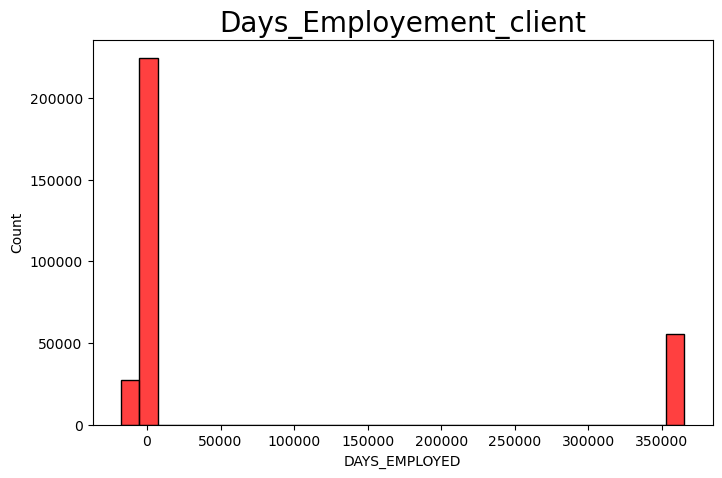

In [36]:
plt.figure(figsize=(8, 5))
sns.histplot(application_train['DAYS_EMPLOYED'], bins = 30, color = 'red')\
              .set_title('Days_Employement_client', fontsize = 20)
plt.show()

In [37]:
# before start cleaning, we keep copy of datasets
train_df = application_train.copy()
test_df = application_test.copy()

In [38]:
train_df[['DAYS_BIRTH', 'DAYS_EMPLOYED','DAYS_REGISTRATION','DAYS_ID_PUBLISH']].describe()

,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH
count,307511.000000,307511.000000,307511.000000,307511.000000
mean,-16036.995067,63815.045904,-4986.120328,-2994.202373
std,4363.988632,141275.766519,3522.886321,1509.450419
min,-25229.000000,-17912.000000,-24672.000000,-7197.000000
25%,-19682.000000,-2760.000000,-7479.500000,-4299.000000
50%,-15750.000000,-1213.000000,-4504.000000,-3254.000000
75%,-12413.000000,-289.000000,-2010.000000,-1720.000000
max,-7489.000000,365243.000000,0.000000,0.000000


- On constate que les variable comme "DAYS_BIRTH", "DAYS_EMPLOYED", "DAYS_REGISTRATION" et "DAYS_IDPUBLISH"  ont des valeurs négatives. 
- On va vérifier la descrition de ces variabes dans le document

**Les nombres de variables sur "DAYS" sont négatifs car ils sont enregistrés par rapport à la demande de prêt en cours.**
**Il est nécessaire de modifier cette variable pour obtenir des chiffres plus compréhensibles pour l'analyse.**

In [39]:
(train_df['DAYS_BIRTH'] / -365).describe()

count    307511.000000
mean         43.936973
std          11.956133
min          20.517808
25%          34.008219
50%          43.150685
75%          53.923288
max          69.120548
Name: DAYS_BIRTH, dtype: float64

In [40]:
# Création d'une nouvelles variables l'age du client
train_df['AGE_CLIENT'] = train_df['DAYS_BIRTH'] / -365
#test_df['AGE_CLIENT'] = test_df['DAYS_BIRTH'] / -365

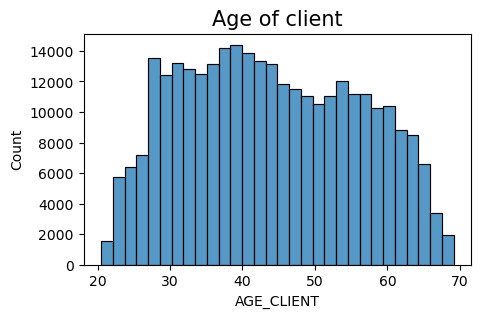

In [41]:
plt.figure(figsize=(5, 3))
sns.histplot(train_df['AGE_CLIENT'], bins = 30).set_title('Age of client', fontsize =15)

plt.show()

### Traiter les outliers pour 'Days_employed'

In [42]:
(train_df['DAYS_EMPLOYED']).describe()

count    307511.000000
mean      63815.045904
std      141275.766519
min      -17912.000000
25%       -2760.000000
50%       -1213.000000
75%        -289.000000
max      365243.000000
Name: DAYS_EMPLOYED, dtype: float64

**On constate des anomalie sur le variable 'Days_employment'**:
- Le max jours d'employment est égale à 1000 années (365243/365j). 


In [43]:
anomalie = train_df[train_df['DAYS_EMPLOYED'] == 365243]
print(color.BOLD + color.BLUE + 'Nombre des ligne avec anomalie de DAYS_EMPLOYED :'+ color.END, len(anomalie))

print(color.BOLD+ color.RED + "Pourcentage des anomalies des DAYS_EMPLOYED:" + color.END, len(anomalie)/train_df.shape[0])
not_anomalie = train_df[train_df['DAYS_EMPLOYED'] != 365243]
print(color.BOLD + color.GREEN +'Pourcentage of not_anomalie :' +color.END, (100 * not_anomalie['TARGET'].mean()))
print(color.BOLD + color.PURPLE +'Pourcentage of anomalie des credit' +color.END, (100 * anomalie['TARGET'].mean()))

Nombre des ligne avec anomalie de DAYS_EMPLOYED : 55374
Pourcentage des anomalies des DAYS_EMPLOYED: 0.18007160719453938
Pourcentage of not_anomalie : 8.65997453765215
Pourcentage of anomalie des credit 5.399646043269405


- Afin de traiter les anomalie de la variable 'DAYS_EMPLOYED' nous allons simplement définir les outliers sur une valeur manquante, puis à les faire remplir (à l'aide de l'imputation). 

In [44]:
# DAYS_EMPLOYED column
train_df['DAYS_EMPLOYED'] = train_df['DAYS_EMPLOYED'].apply(lambda x: np.nan if x==365243 else x)
#test_df['DAYS_EMPLOYED'] = test_df['DAYS_EMPLOYED'].apply(lambda x: np.nan if x==365243 else x)

In [45]:
# check
print(train_df['DAYS_EMPLOYED'].max())
#print(test_df['DAYS_EMPLOYED'].max())

0.0


In [46]:
# DAYS_LAST_PHONE_CHANGE column
train_df['DAYS_LAST_PHONE_CHANGE'] = train_df['DAYS_LAST_PHONE_CHANGE'].apply(lambda x: np.nan if x==0.0 else x)
#test_df['DAYS_LAST_PHONE_CHANGE'] = test_df['DAYS_LAST_PHONE_CHANGE'].apply(lambda x: np.nan if x==0.0 else x)

In [47]:
# check
print(train_df['DAYS_LAST_PHONE_CHANGE'].max())
#print(test_df['DAYS_LAST_PHONE_CHANGE'].max())

-1.0


In [48]:
# Créer un colone pour les valeurs abberantes de 'days_employed'
#application_train['DAYS_EMPLOYED_OUTLIERS'] = application_train["DAYS_EMPLOYED"] == 365243

# Remplacer les valeurs aberrantes par Nan
#Replace outliers values with nan
#application_train['DAYS_EMPLOYED'].replace({365243: np.nan}, inplace = True)

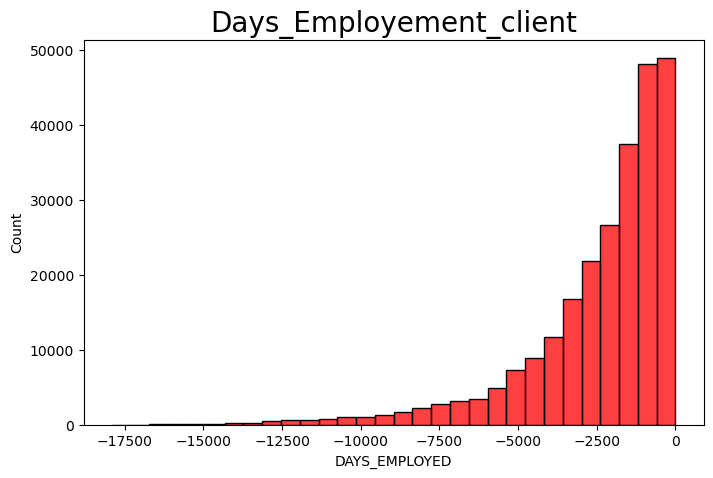

In [49]:
plt.figure(figsize=(8, 5))
sns.histplot(train_df['DAYS_EMPLOYED'], bins = 30, color = 'red')\
              .set_title('Days_Employement_client', fontsize = 20)

plt.show()

- **Nous allons effectuer la meme démarche pour traiter les anomalies dans "Application_test"**

In [50]:
anomalie_test = application_test[application_test['DAYS_EMPLOYED'] == 365243]
print(color.BOLD + color.BLUE + 'Nombre des ligne avec anomalie de DAYS_EMPLOYED_test:'+ color.END, len(anomalie_test))

print(color.BOLD+ color.RED + "Pourcentage des anomalies des DAYS_EMPLOYED_test:" + color.END, len(anomalie_test)/application_test.shape[0])
not_anomalie_test = application_test[application_test['DAYS_EMPLOYED'] != 365243]


Nombre des ligne avec anomalie de DAYS_EMPLOYED_test: 9274
Pourcentage des anomalies des DAYS_EMPLOYED_test: 0.1902593139668472


In [51]:
# extract all records doesn't have XNA value in CODE_GENDER column
train_df = train_df[train_df['CODE_GENDER']!='XNA']

# check
train_df['CODE_GENDER'].value_counts()

F    202448
M    105059
Name: CODE_GENDER, dtype: int64

In [52]:
train_df['DAYS_BIRTH'].describe()

count    307507.000000
mean     -16037.027271
std        4363.982424
min      -25229.000000
25%      -19682.000000
50%      -15750.000000
75%      -12413.000000
max       -7489.000000
Name: DAYS_BIRTH, dtype: float64

In [53]:
dashboard_data = train_df.copy()
def imputation(df):
    #df.dropna(inplace=True)
    df.fillna(df.median(), inplace=True)
    return df
imputation(dashboard_data)

dashboard_data.to_csv(r"C:\Users\faeze\OneDrive\Documents\OC data science\PROJECT\Projet 7\dashboard_data.csv")

##  3.5. Analyse bivariée : variable cible vs les autres variables 


- Le nom de la colonne dont on cherche à prédire la valeur est "TARGET".

- La variable prend soit la valeur 0 quand le prêt a été remboursé sans soucis, soit la valeur 1 quand il y a eu un défaut de payement.

**- Target = 1 Client ne peux pas payer le crédit**

**- Target = 0 Client peux payer le crédit**

In [54]:
train_df['TARGET'].isnull().sum()

0

In [55]:
train_df['TARGET'].value_counts()

0    282682
1     24825
Name: TARGET, dtype: int64

In [56]:
target_rate=(train_df['TARGET']==1).sum()/train_df.shape[0]
target_rate

0.08072986956394489

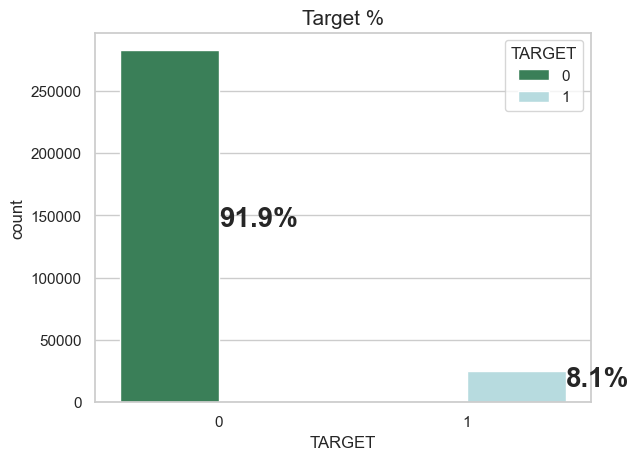

In [57]:
palette = ["#2E8B57", "#B0E0E6", "#DA70D6", "#BC8F8F", "#6495ED"]
sns.set(style="whitegrid")
#plt.figure(figsize=(8,8))
total = float(len(train_df))
ax = sns.countplot(x="TARGET", hue="TARGET", data=train_df,
                   palette= palette)
plt.title('Target %', fontsize=15)
for p in ax.patches:
    percentage = '{:.1f}%'.format(100 * p.get_height()/total)
    x = p.get_x() + p.get_width()
    y = p.get_y() + p.get_height()/2
    ax.annotate(percentage, (x, y), fontsize=20, fontweight='bold')
plt.show()

- **92 % des prêts ont été remboursés et donc 8 % des individus ont été non solvables.**



###   Analyse bivariée de la variable cible vs les variables catégorielles 


- **L'objectif est de nous focaliser sur les variables qui peuvent etre important dans la prise de décision de l'attributionn du crédit.**


In [58]:
# la descrption des variables categorielle 
app_train_desc[app_train_desc['Row'].isin(categ_variable_list)]


,Unnamed: 0,Table,Row,Description,Special
2,5,application_{train|test}.csv,NAME_CONTRACT_TYPE,Identification if loan is cash or revolving,NaN
3,6,application_{train|test}.csv,CODE_GENDER,Gender of the client,NaN
4,7,application_{train|test}.csv,FLAG_OWN_CAR,Flag if the client owns a car,NaN
5,8,application_{train|test}.csv,FLAG_OWN_REALTY,Flag if client owns a house or flat,NaN
11,14,application_{train|test}.csv,NAME_TYPE_SUITE,Who was accompanying client when he was applyi...,NaN
12,15,application_{train|test}.csv,NAME_INCOME_TYPE,"Clients income type (businessman, working, mat...",NaN
13,16,application_{train|test}.csv,NAME_EDUCATION_TYPE,Level of highest education the client achieved,NaN
14,17,application_{train|test}.csv,NAME_FAMILY_STATUS,Family status of the client,NaN
15,18,application_{train|test}.csv,NAME_HOUSING_TYPE,What is the housing situation of the client (r...,NaN
28,31,application_{train|test}.csv,OCCUPATION_TYPE,What kind of occupation does the client have,NaN


- **Les varaibles catégorielles ( les informations des cleints) qui peunvent etre intéressants sont :** 
        - 1. Gender
        - 2. Type de contrat
        - 3. Car owner
        - 4. Familly Staut
        - 5. Education level
        - 6. Employment
        - 7. Houssing type
        - 8. Income Type
        - 9. Organization where client works

In [61]:
app_train_0 = train_df[train_df['TARGET']==0]
app_train_1 = train_df[train_df['TARGET']==1]

In [62]:
    # Police de titre des plots    
font_title1 = {'family': 'serif',
               'color' : "#339CFF",
              'weight': 'bold',
              'size': 20
             }

font_title2 = {'family': 'serif',
               'color' : "#CE33FF",
              'weight': 'bold',
              'size': 20
             }


In [63]:
def plot_stat(data, feature, title) : 
    
    ax, fig = plt.subplots(figsize=(8,5)) 
    ax = sns.countplot(y=feature, data=data, order =data[feature].value_counts(ascending=False).index, palette = 'bright')
    ax.set_title(title, fontsize=15)
    plt.xticks(size=10)
    plt.yticks(size=10)
    plt.xlabel("", size=10)
    plt.ylabel("", size=10)


    
    for p in ax.patches:
                percentage = '{:.1f}%'.format(100 * p.get_width()/len(data[feature]))
                x = p.get_x() + p.get_width()
                y = p.get_y() + p.get_height()/2
                ax.annotate(percentage, (x, y), fontsize=15, fontweight='bold')

    
def plot_percent_target1(data, feature, title) : 
    
    cat_perc = data[[feature, 'TARGET']].groupby([feature],as_index=False).mean()
    cat_perc.sort_values(by='TARGET', ascending=False, inplace=True)
    
    ax, fig = plt.subplots(figsize=(8,5)) 
    ax = sns.barplot(y=feature, x='TARGET', data=cat_perc, palette = 'dark')
    ax.set_title(title, fontsize=15)
    plt.xticks(size=10)
    plt.yticks(size=10)
    plt.xlabel("", size=10)
    plt.ylabel("", size=10)
    
    
    #ax.set_ylabel("Percent of target with value 1")

    for p in ax.patches:
                percentage = '{:.1f}%'.format(100 * p.get_width())
                x = p.get_x() + p.get_width()
                y = p.get_y() + p.get_height()/2
                ax.annotate(percentage, (x, y), fontsize=15, fontweight='bold')

                                   -------------------------------------------------------


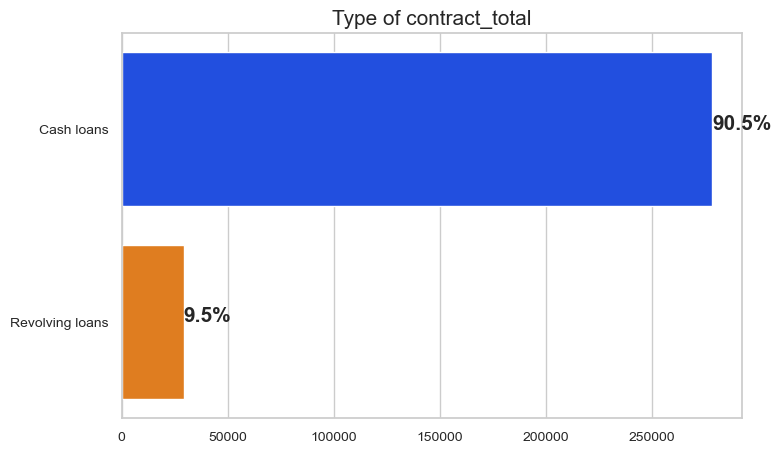

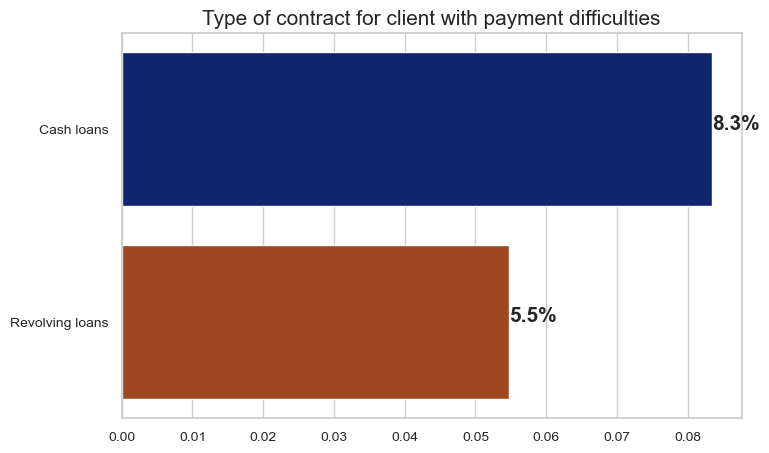

In [64]:
#NAME_CONTRACT_TYPE
plot_stat(train_df, 'NAME_CONTRACT_TYPE',"Type of contract_total")
print("                                   -------------------------------------------------------")
plot_percent_target1(train_df, 'NAME_CONTRACT_TYPE',"Type of contract for client with payment difficulties")

- Type de contrat "Revolving loan" ne représentent qu'une petite fraction (5 %) du nombre total de prêts 
- Un plus grand nombre de prêts renouvelables, par rapport à leur fréquence, ne sont pas remboursés.

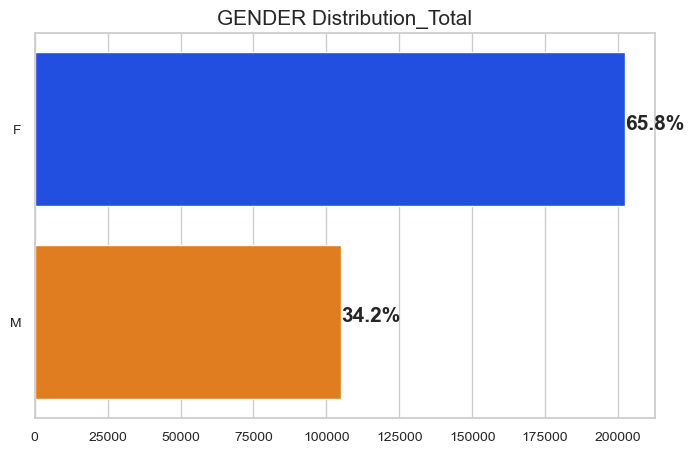

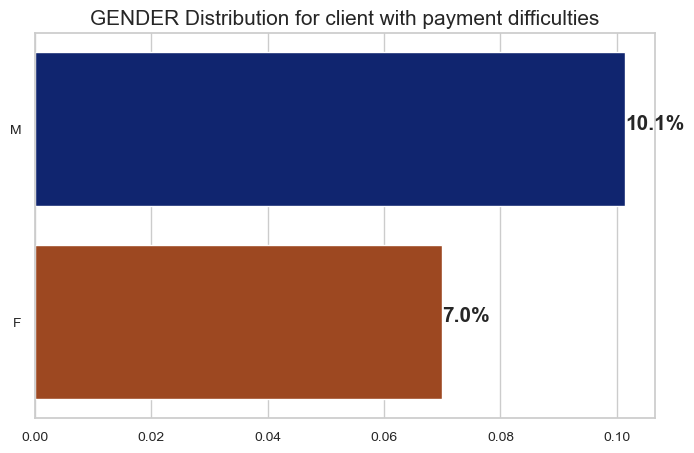

In [65]:
#CODE_GENDER
plot_stat(train_df, 'CODE_GENDER',"GENDER Distribution_Total")
plot_percent_target1(train_df, 'CODE_GENDER',"GENDER Distribution for client with payment difficulties")

- Le nombre de femmes est presque le double du nombre des hommes. 
- En ce qui concerne le pourcentage de crédits non_remboursé, les hommes ont plus de chances de ne pas rembourser leurs prêts (10 %), par rapport aux femmes (7 %).

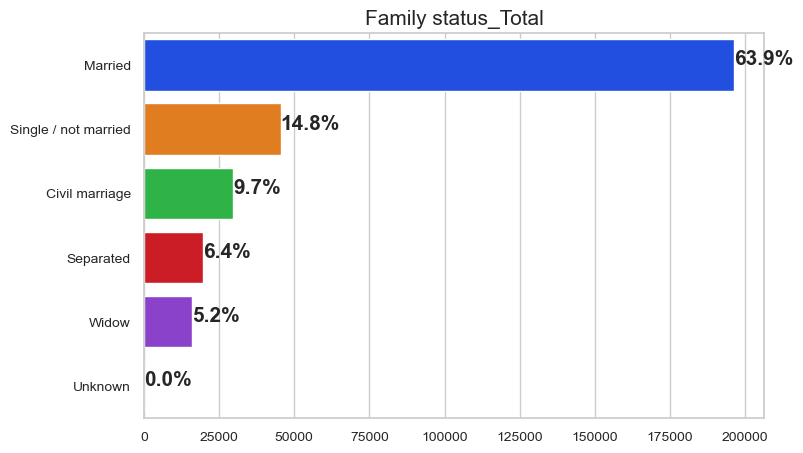

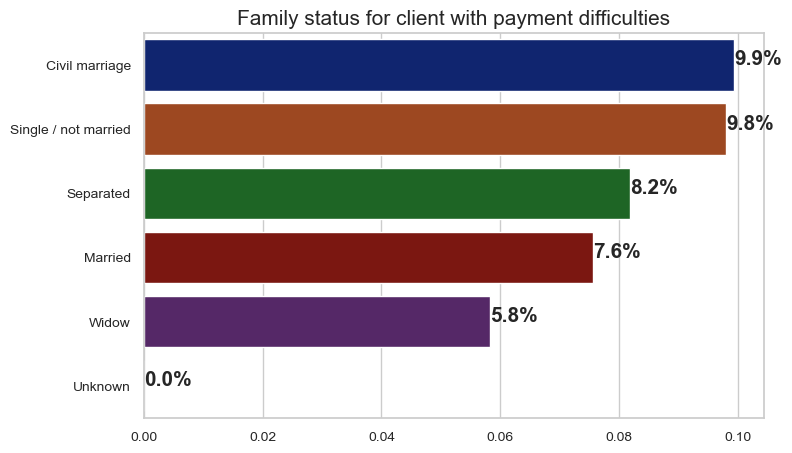

In [66]:
#NAME_FAMILY_STATUS
plot_stat(train_df, 'NAME_FAMILY_STATUS',"Family status_Total")
plot_percent_target1(train_df, 'NAME_FAMILY_STATUS',"Family status for client with payment difficulties")

- La plupart des clients sont mariés, suivis des célibataires/non mariés et des mariages civils.

- En termes de pourcentage de non-remboursement du prêt, le mariage civil a le pourcentage le plus élevé de non-remboursement (10 %), les veufs étant la plus faible (l'exception étant inconnue).

                                   -------------------------------------------------------


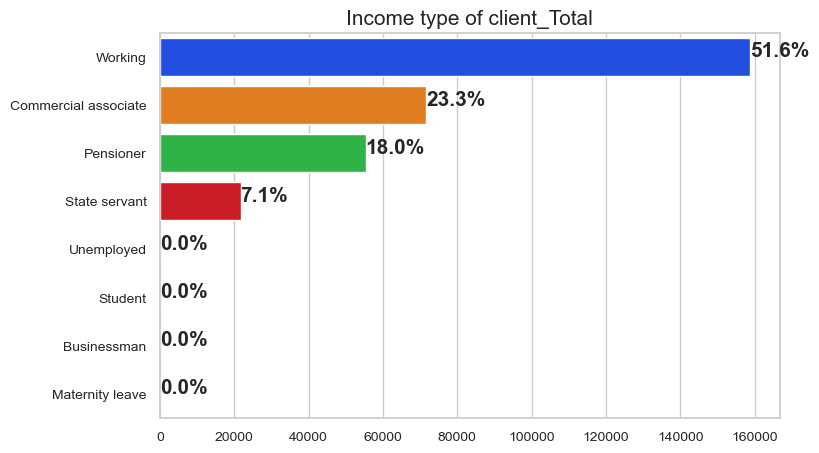

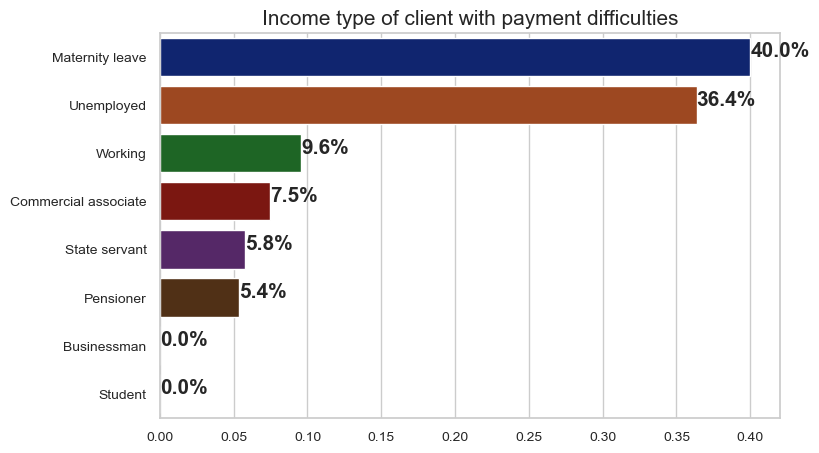

In [67]:
#NAME_INCOME_TYPE
plot_stat(train_df, 'NAME_INCOME_TYPE',"Income type of client_Total")
print("                                   -------------------------------------------------------")
plot_percent_target1(train_df, 'NAME_INCOME_TYPE',"Income type of client with payment difficulties")

- La plupart des demandeurs de prêts sont des revenus de travail, suivis d'un associé commercial, d'un retraité et d'un fonctionnaire.

- Les demandeur de crédit avec le type de revenu Congé de maternité ont un taux de près de 40% de prêts non remboursés, suivis des chômeurs (37%). 
- Les autres types de revenus sont inférieurs à la moyenne de 10 % pour les prêts non remboursés.

                                   -------------------------------------------------------


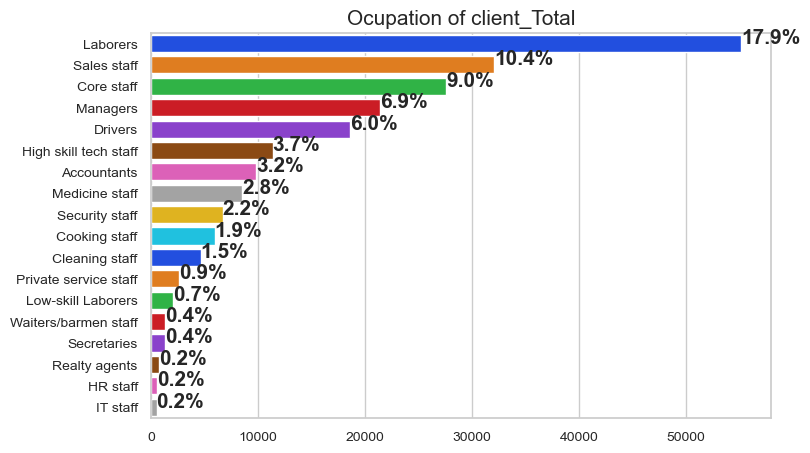

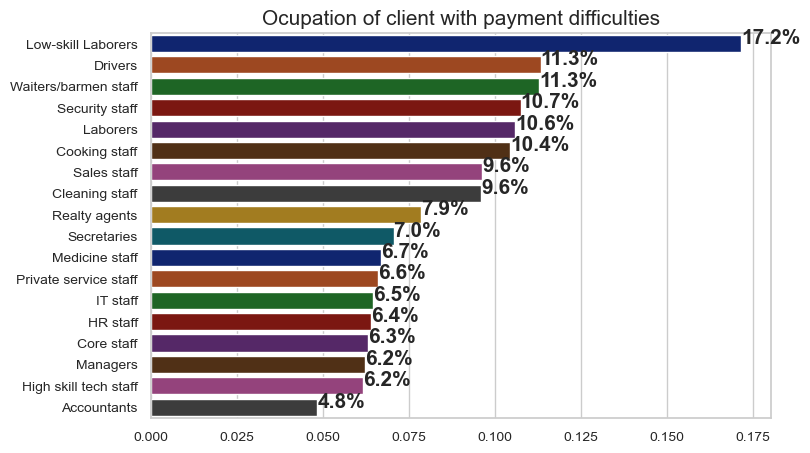

In [68]:

#OCCUPATION_TYPE
plot_stat(train_df, 'OCCUPATION_TYPE',"Ocupation of client_Total")
print("                                   -------------------------------------------------------")
plot_percent_target1(train_df, 'OCCUPATION_TYPE',"Ocupation of client with payment difficulties")

- La plupart des prêts sont contractés par les ouvriers, suivis par les vendeurs. Le personnel informatique prend le montant le moins élevé de prêts.

- La catégorie avec le pourcentage le plus élevé de prêts non remboursés est celle des ouvriers peu qualifiés (plus de 17 %), suivie des chauffeurs et des serveurs/barmen, du personnel de sécurité, des ouvriers et du personnel de cuisine.

                                   -------------------------------------------------------


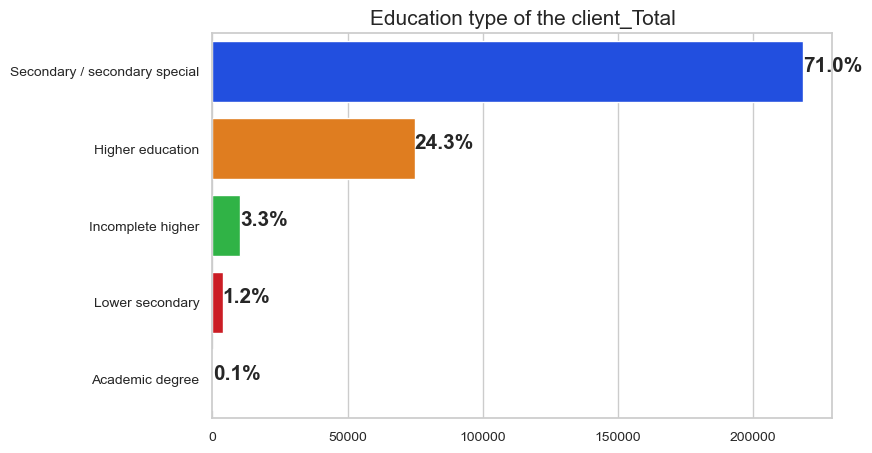

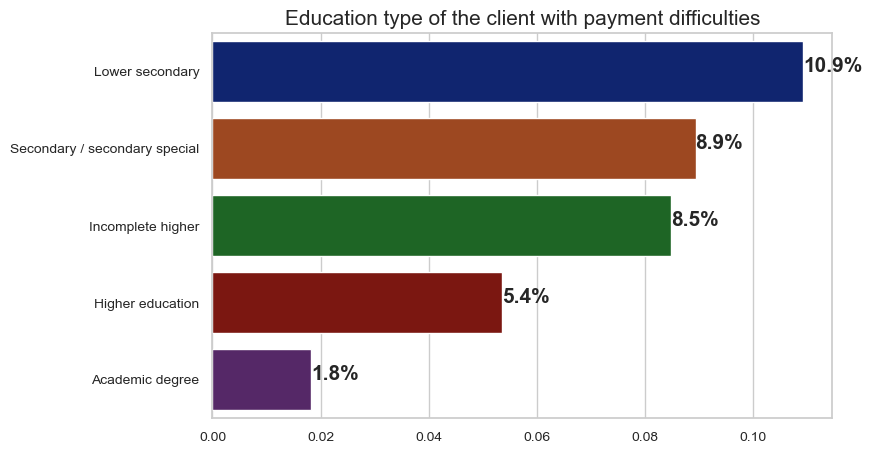

In [69]:
#NAME_EDUCATION_TYPE
plot_stat(train_df, 'NAME_EDUCATION_TYPE',"Education type of the client_Total")
print("                                   -------------------------------------------------------")
plot_percent_target1(train_df, 'NAME_EDUCATION_TYPE',"Education type of the client with payment difficulties")

- La majorité des clients ont une éducation spéciale secondaire / secondaire, suivie par les clients ayant une éducation supérieure. Seul un très petit nombre a un diplôme universitaire.

- La catégorie "Lower Secondary" a le plus fort taux de non remboursement du prêt (11%).
- Les personnes titulaires d'un diplôme universitaire ont un taux de non-remboursement inférieur à 2%.

                                   -------------------------------------------------------


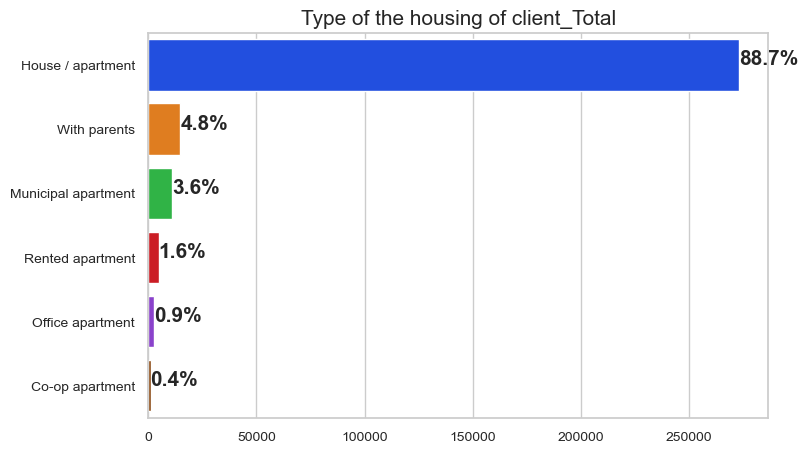

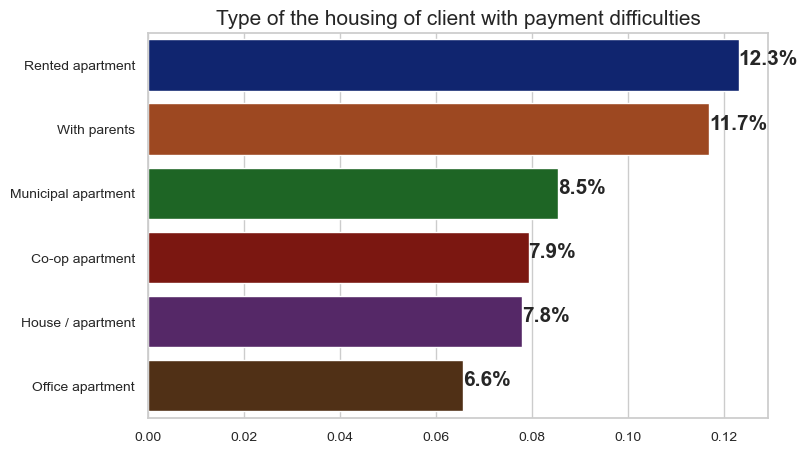

In [70]:

#NAME_HOUSING_TYPE
plot_stat(train_df, 'NAME_HOUSING_TYPE',"Type of the housing of client_Total")
print("                                   -------------------------------------------------------")
plot_percent_target1(train_df, 'NAME_HOUSING_TYPE',"Type of the housing of client with payment difficulties")

- Plus de 88% demandeurs de crédits ont inscrit leur logement en Maison/Appartement.
- Les catégories suivantes ont un très petit nombre de clients( Ceux qui vivent avec leur parents ou qui vit dans un  appartement municipal).

- Parmi les clients qui n'ont pas remboursé leur crédits ceux qui sont locataires ou vivent avecce leurs parente sont plus nombreux( supérieuer à 11 %)

                                   -------------------------------------------------------


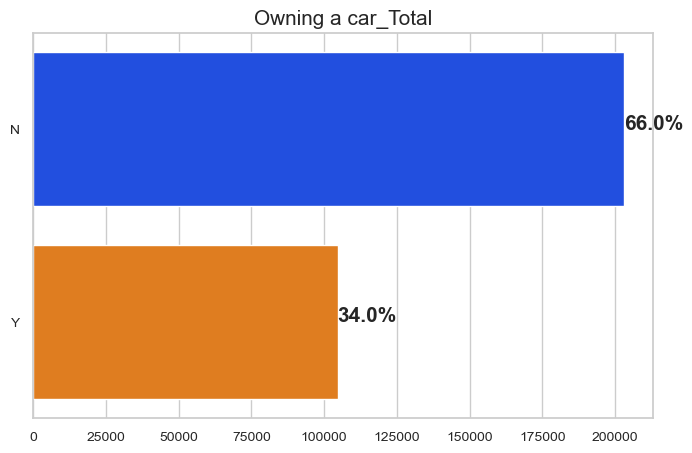

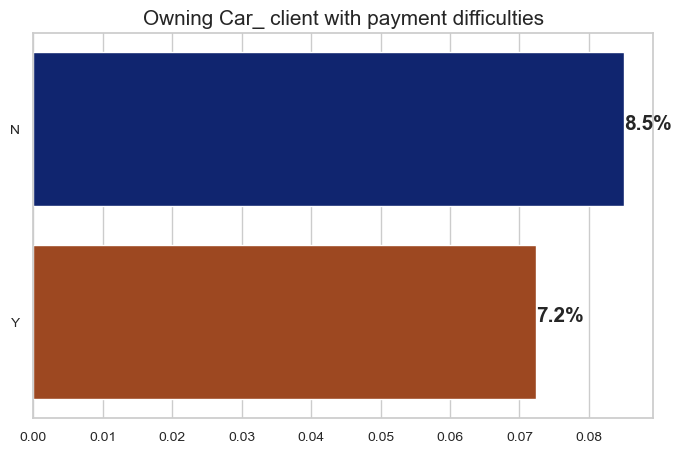

In [71]:
#Flag_Own_Car
plot_stat(train_df, 'FLAG_OWN_CAR',"Owning a car_Total")
print("                                   -------------------------------------------------------")
plot_percent_target1(train_df, 'FLAG_OWN_CAR',"Owning Car_ client with payment difficulties")

- Les clients qui possèdent une voiture représentent près de la moitié de ceux qui n'en possèdent pas.
- Les clients qui possèdent une voiture sont moins susceptibles de ne pas rembourser leur dette. 

-------------------------------------------------------


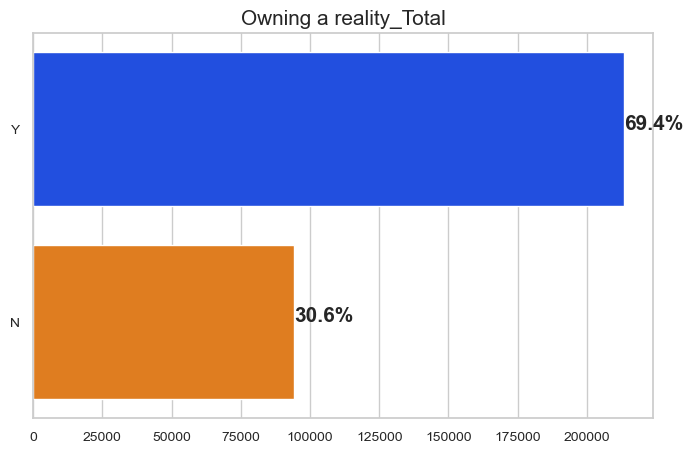

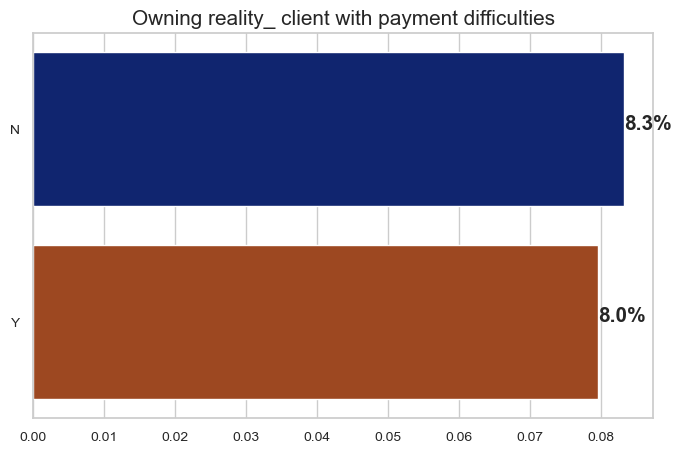

In [72]:
#Flag_Own_Car
plot_stat(train_df, 'FLAG_OWN_REALTY',"Owning a reality_Total")
print("-------------------------------------------------------")
plot_percent_target1(train_df, 'FLAG_OWN_REALTY',"Owning reality_ client with payment difficulties")


- Les clients qui possèdent des biens immobiliers sont plus du double de ceux qui ne possèdent pas. 
- Les deux catégories (propriétaires immobiliers ou non propriétaires) ont des taux de non-remboursement presque 8%

### Analyse bivariée de la variable cible vs les variables variables numériques

In [73]:
#Plot distribution d'une variable vs Target
def plot_distribution_comp(feature, title):
    plt.figure(figsize=(20,6))

    t0 = train_df.loc[train_df['TARGET'] == 0]
    t1 = train_df.loc[train_df['TARGET'] == 1]

    
    sns.kdeplot(t0[feature].dropna(), color='blue', label="TARGET = 0")
    sns.kdeplot(t1[feature].dropna(), color='red', label="TARGET = 1")
    plt.title(title, fontsize= 45)
    plt.ylabel('')
    plt.legend()
    plt.show()   

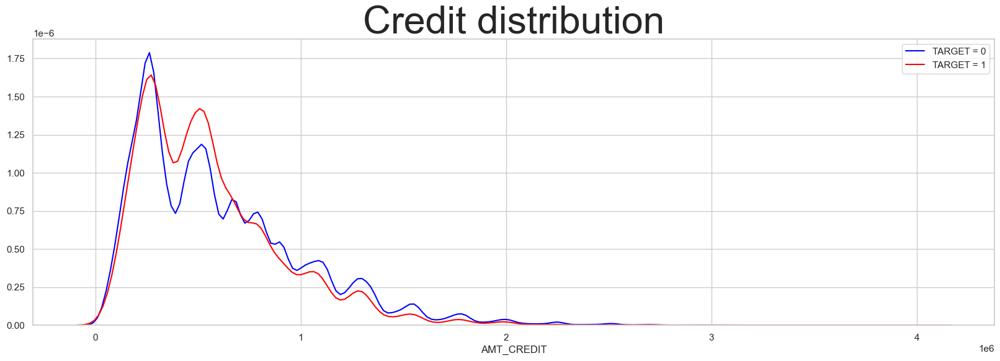

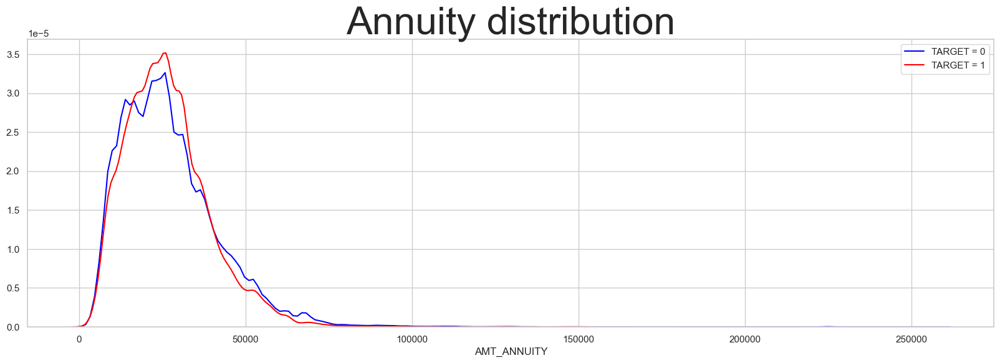

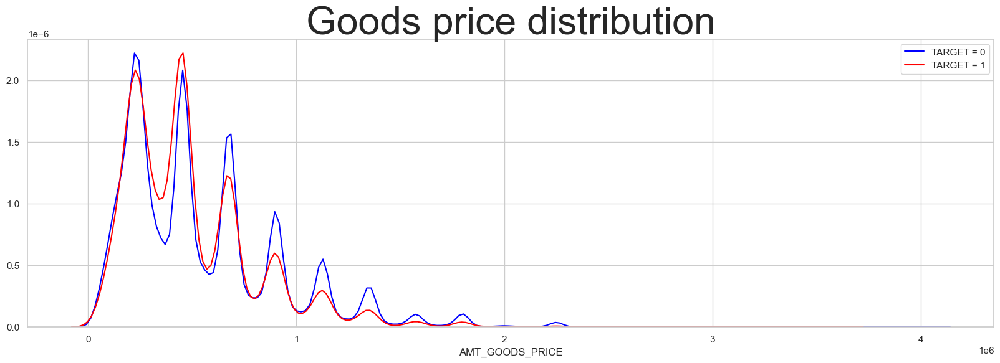

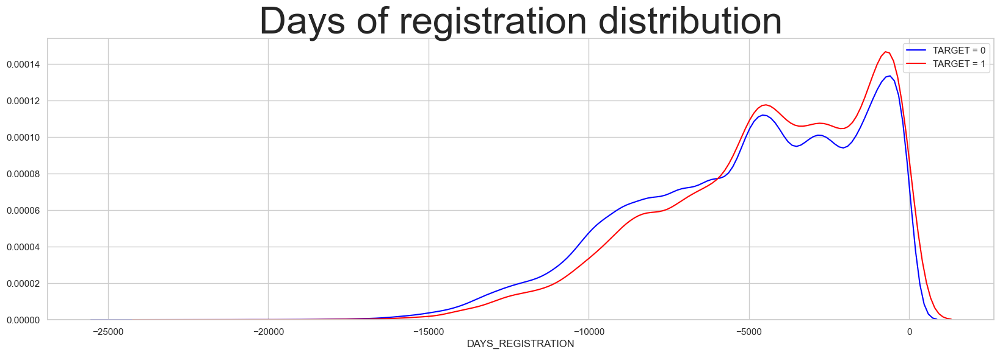

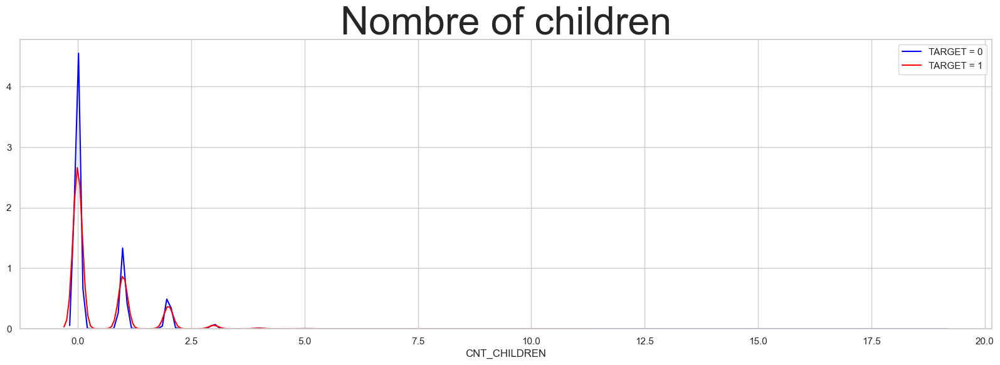

In [74]:
plot_distribution_comp('AMT_CREDIT', "Credit distribution")                                 
plot_distribution_comp('AMT_ANNUITY', "Annuity distribution")
plot_distribution_comp('AMT_GOODS_PRICE', "Goods price distribution")
plot_distribution_comp('DAYS_REGISTRATION', "Days of registration distribution")
plot_distribution_comp('CNT_CHILDREN', "Nombre of children")

In [75]:
# Plot distribution of one feature
def plot_distribution2(feature,color):
    plt.figure(figsize=(10,6))
    plt.title("Distribution of %s" % feature)
    sns.distplot(train_df[feature].dropna(),color=color, kde=True,bins=100)
    plt.show() 

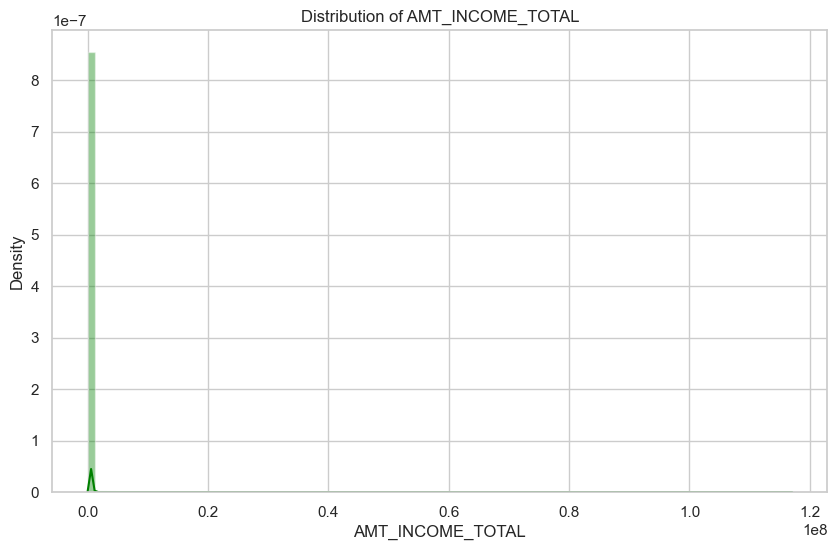

In [76]:
plot_distribution2('AMT_INCOME_TOTAL','green')

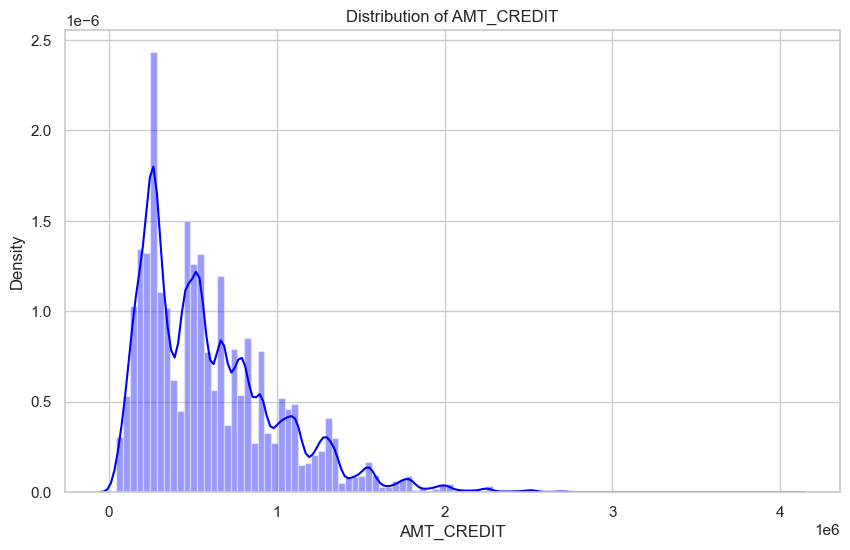

In [77]:
plot_distribution2('AMT_CREDIT','blue')

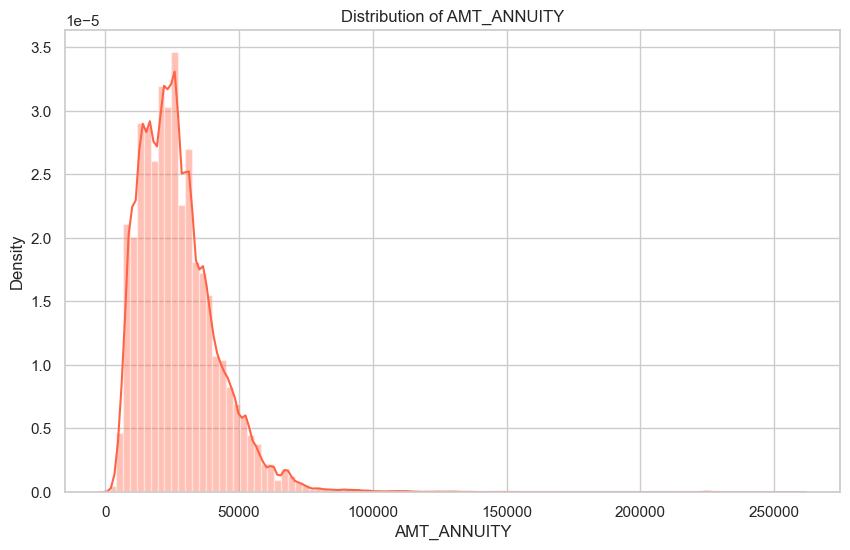

In [78]:
plot_distribution2('AMT_ANNUITY','tomato')

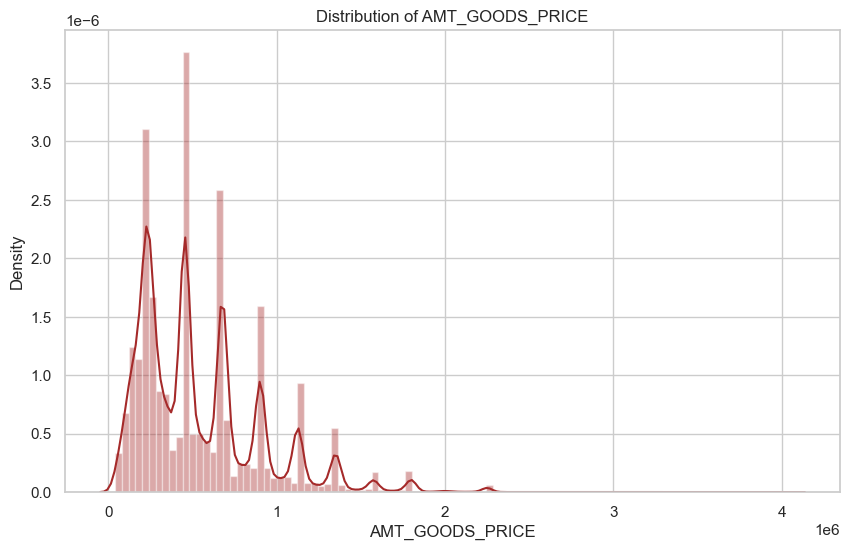

In [79]:
plot_distribution2('AMT_GOODS_PRICE','brown')

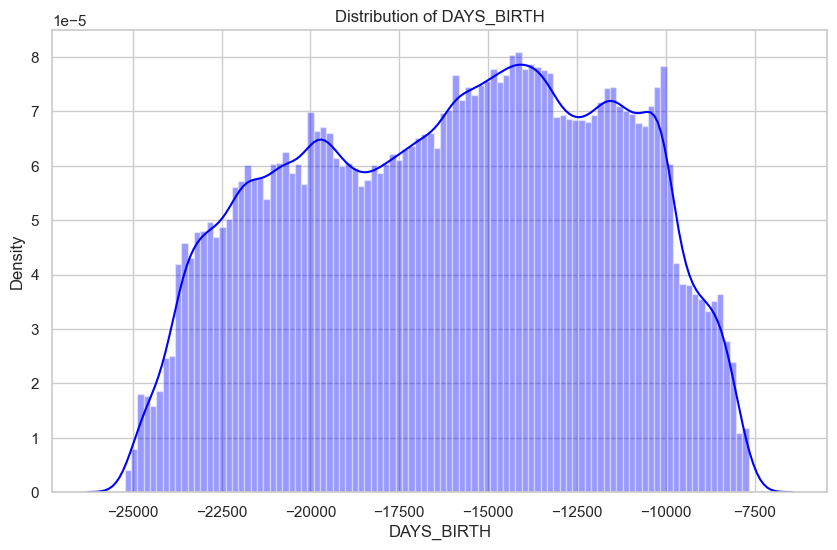

In [80]:
plot_distribution2('DAYS_BIRTH','blue')

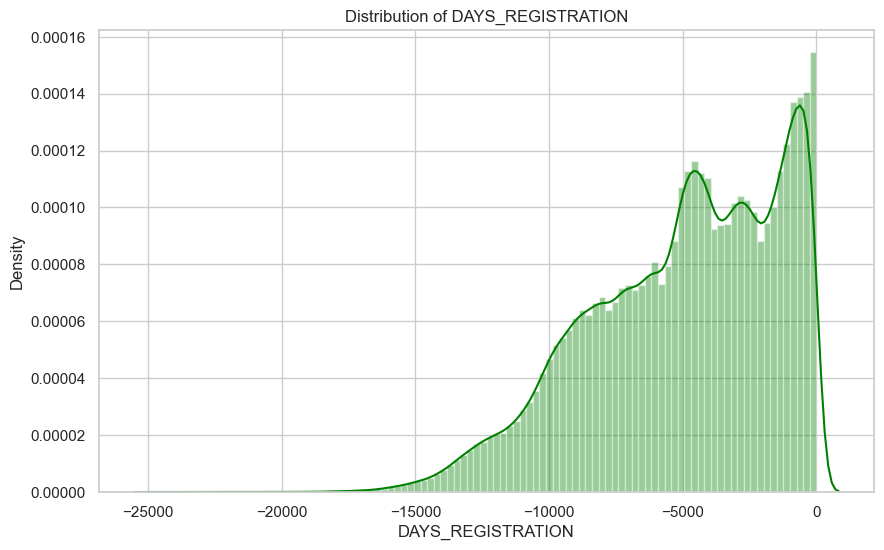

In [81]:
plot_distribution2('DAYS_REGISTRATION','green')

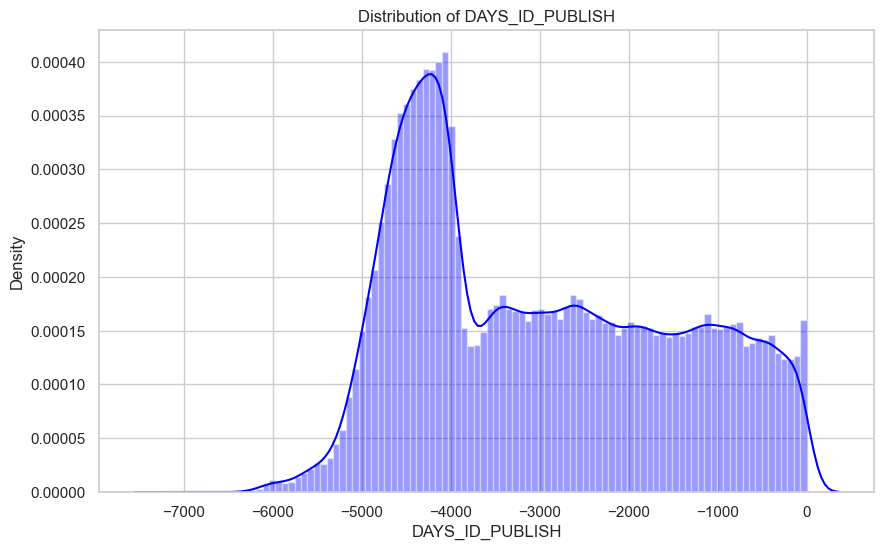

In [82]:

plot_distribution2('DAYS_ID_PUBLISH','blue')

# 4.Analyse exploratoire de "bureau_data" 

- Le dataframe "Bureau" contient tous les crédits antérieurs du client fournis par d'autres institutions financières qui ont été signalés au "Credit Bureau" (pour les clients qui ont un prêt dans l'échantillon). Pour chaque prêt,  il y a autant de lignes que le nombre de crédits que le client avait avant la date de la demande. SK_ID_CURR est la clé reliant les données application_train|test aux données du bureau. 

- Avant d'effectuer une analyse exploratoire sur le dataframe "Bureau", on va le fusionner avec "application" sur le clé "SK_ID_CURR"

In [83]:
bureau[bureau['SK_ID_CURR'].duplicated()].sort_values(by='SK_ID_CURR', ascending=True)


,SK_ID_CURR,SK_ID_BUREAU,CREDIT_ACTIVE,CREDIT_CURRENCY,DAYS_CREDIT,CREDIT_DAY_OVERDUE,DAYS_CREDIT_ENDDATE,DAYS_ENDDATE_FACT,AMT_CREDIT_MAX_OVERDUE,CNT_CREDIT_PROLONG,AMT_CREDIT_SUM,AMT_CREDIT_SUM_DEBT,AMT_CREDIT_SUM_LIMIT,AMT_CREDIT_SUM_OVERDUE,CREDIT_TYPE,DAYS_CREDIT_UPDATE,AMT_ANNUITY
248486,100001,5896632,Closed,currency 1,-879,0,-514.0,-544.0,NaN,0,91620.0,0.00,0.0,0.0,Consumer credit,-155,0.0
248488,100001,5896634,Active,currency 1,-559,0,902.0,NaN,NaN,0,337680.0,113166.00,0.0,0.0,Consumer credit,-6,4630.5
248489,100001,5896635,Active,currency 1,-49,0,1778.0,NaN,NaN,0,378000.0,373239.00,0.0,0.0,Consumer credit,-16,10822.5
248485,100001,5896631,Closed,currency 1,-909,0,-179.0,-877.0,NaN,0,279720.0,0.00,0.0,0.0,Consumer credit,-155,0.0
248487,100001,5896633,Closed,currency 1,-1572,0,-1329.0,-1328.0,NaN,0,85500.0,0.00,0.0,0.0,Consumer credit,-155,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1010005,456255,5126329,Active,currency 1,-573,0,523.0,NaN,NaN,0,553500.0,324171.00,0.0,0.0,Consumer credit,-19,0.0
1010006,456255,5126330,Closed,currency 1,-1021,0,-959.0,-959.0,NaN,0,22995.0,0.00,NaN,0.0,Consumer credit,-953,3244.5
1010008,456255,5126332,Active,currency 1,-378,0,27320.0,NaN,NaN,0,90000.0,61060.50,NaN,0.0,Credit card,-11,NaN
1010010,456255,5126334,Active,currency 1,-451,0,279.0,NaN,15439.905,0,450000.0,191005.47,0.0,0.0,Consumer credit,-55,3244.5


In [84]:
application_bureau_train = train_df.merge(bureau, left_on='SK_ID_CURR', right_on='SK_ID_CURR', how='inner')


In [85]:
print("The resulting dataframe `application_bureau_train` has ",application_bureau_train.shape[0]," rows and ", 
      application_bureau_train.shape[1]," columns.")

The resulting dataframe `application_bureau_train` has  1465291  rows and  139  columns.


###  Analyse bivariée de la variable cible vs les variables variables catégorielles 

In [87]:
def plot_b_stats(feature,label_rotation=False,horizontal_layout=True):
    temp = application_bureau_train[feature].value_counts()
    df1 = pd.DataFrame({feature: temp.index,'Number of contracts': temp.values})

    # Calculate the percentage of target=1 per category value
    cat_perc = application_bureau_train[[feature, 'TARGET']].groupby([feature],as_index=False).mean()
    cat_perc.sort_values(by='TARGET', ascending=False, inplace=True)
    
    if(horizontal_layout):
        fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(12,6))
    else:
        fig, (ax1, ax2) = plt.subplots(nrows=2, figsize=(12,14))
    sns.set_color_codes("pastel")
    s = sns.barplot(ax=ax1, x = feature, y="Number of contracts",data=df1)
    if(label_rotation):
        s.set_xticklabels(s.get_xticklabels(),rotation=90)
    
    s = sns.barplot(ax=ax2, x = feature, y='TARGET', order=cat_perc[feature], data=cat_perc)
    if(label_rotation):
        s.set_xticklabels(s.get_xticklabels(),rotation=90)
    plt.ylabel('Percent of target with value 1 [%]', fontsize=10)
    plt.tick_params(axis='both', which='major', labelsize=10)

    plt.show();

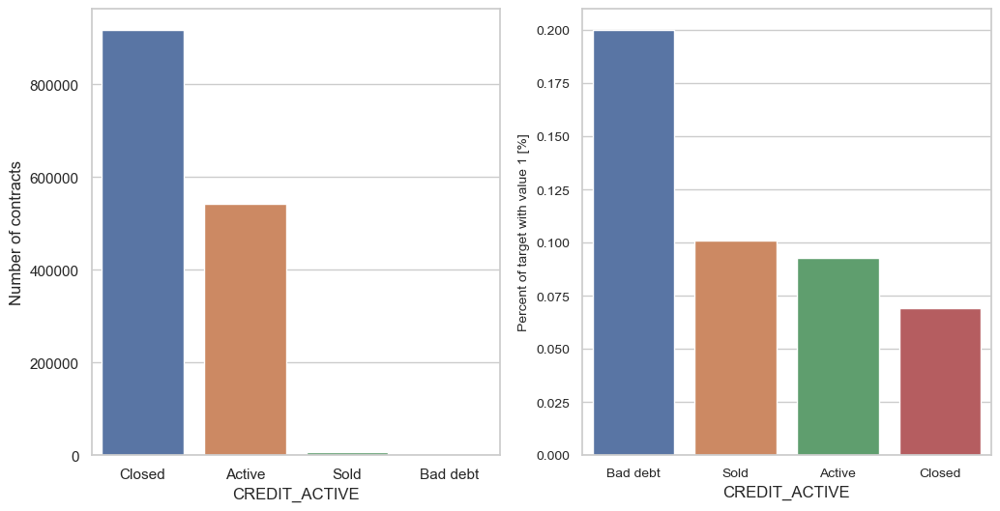

In [88]:
plot_b_stats('CREDIT_ACTIVE')

- La plupart des crédits enregistrés au Credit Bureau sont dans le statut Clôturé (~900K). À la deuxième place se trouvent les crédits actifs (un peu moins de 600K). Les créances vendues et irrécouvrables ne sont que quelques-unes.

Dans le même temps, en tant que pourcentage ayant TARGET = 1 du nombre total par catégorie, les clients avec des crédits enregistrés auprès du Bureau de crédit avec créance irrécouvrable ont 20% de défaut sur les applications actuelles.

Les clients avec des crédits Vendus, Actifs et Fermés et qui n'ont pas rembroursé leur crédit sont inférieur à 10 % (10 % étant le taux global). Le plus petit taux de crédit non_remboursé  appartiennte aux clients avec des crédits enregistrés au bureau de crédit avec des crédits fermés.

Cela signifie que l'ancien historique de crédit enregistré (tel qu'enregistré au bureau de crédit) est un indicateur puissant pour le non_remboursement du crédit, puisque le pourcentage de demandes en défaut avec un historique de créances irrécouvrables est deux fois plus important que pour Vendu ou Actif et presque trois fois plus grand que pour Fermé.

### Target vs Credit currency
- **A pprésent On va vérifier deux choses :** 
  - le nombre de crédits enregistrés avec différentes devises 
  - le pourcentage de crédits non remboursés (pour les demandes en cours) par différentes devises de crédits enregistrés dans le passé pour le même client.

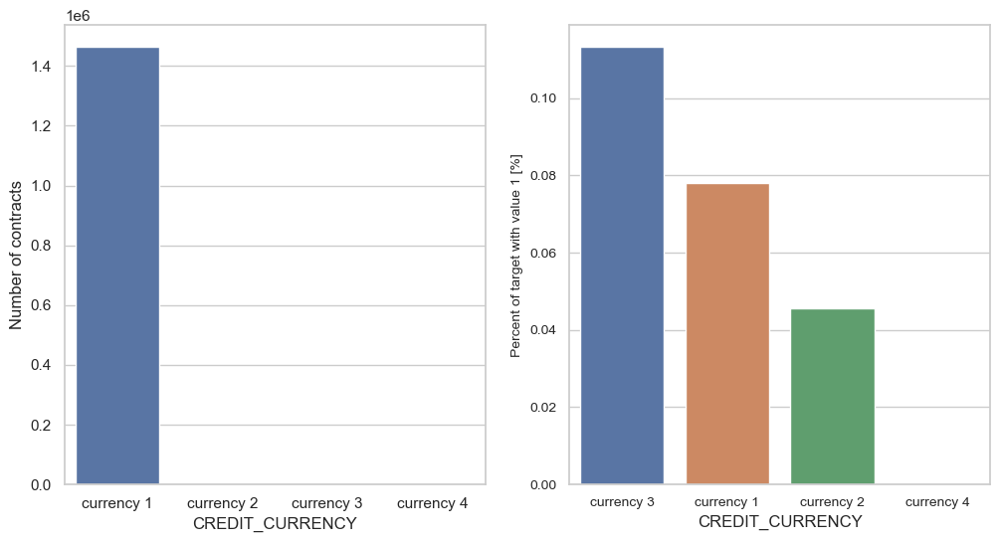

In [90]:

plot_b_stats('CREDIT_CURRENCY')

- **on constate que selon la devise, le pourcentage de clients non_solvables est assez différent.** 



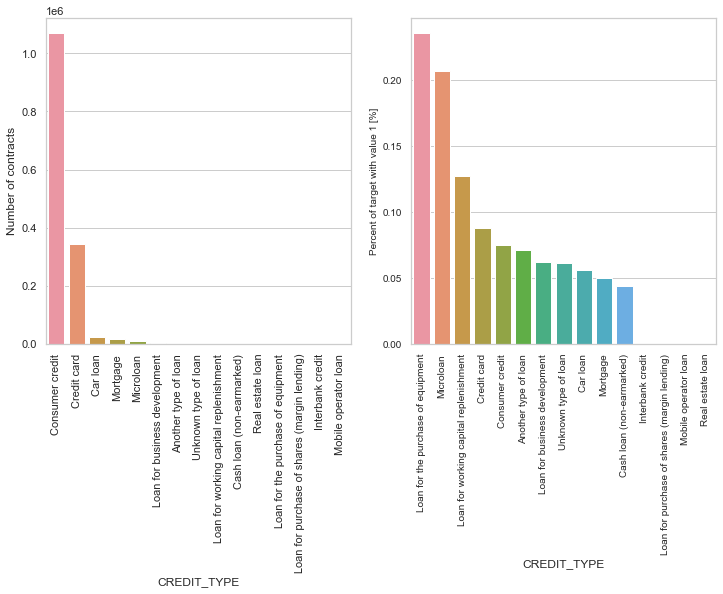

In [133]:
plot_b_stats('CREDIT_TYPE', True, True)

- La majorité des crédits historiques enregistrés sont des crédits à la consommation et des cartes de crédit.


### Analyse univariée des variables numériques de "bureau_data"

In [94]:
def plot_b_distribution(feature,color):
    plt.figure(figsize=(10,6))
    plt.title("Distribution of %s" % feature)
    sns.distplot(application_bureau_train[feature].dropna(),color=color, kde=True,bins=100)
    plt.show() 
    

### Durée de prêt (DAYS_CREDIT)

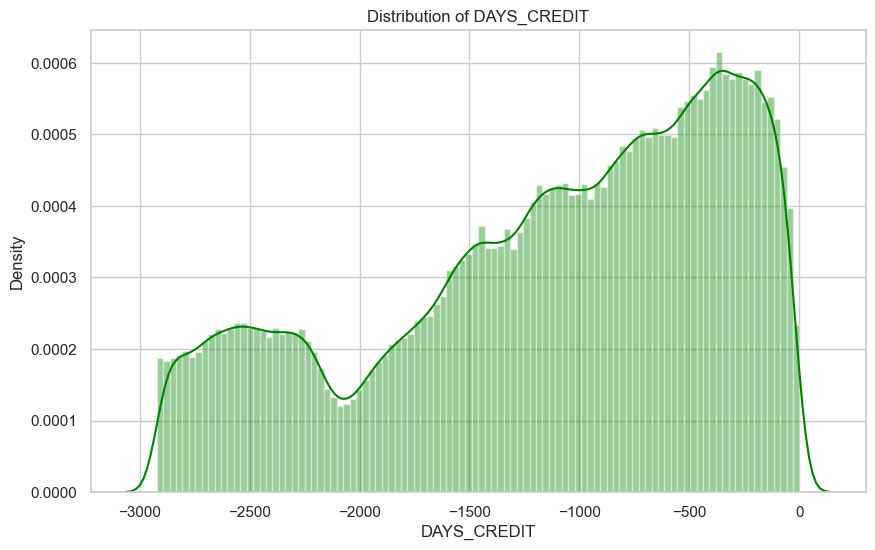

In [96]:
# Distribution de nombre de jours des crédits 
plot_b_distribution('DAYS_CREDIT','green')

- La max durée du crédit est 3000 jours,  avec un pic autour de 300 jours (soit moins d'un an).

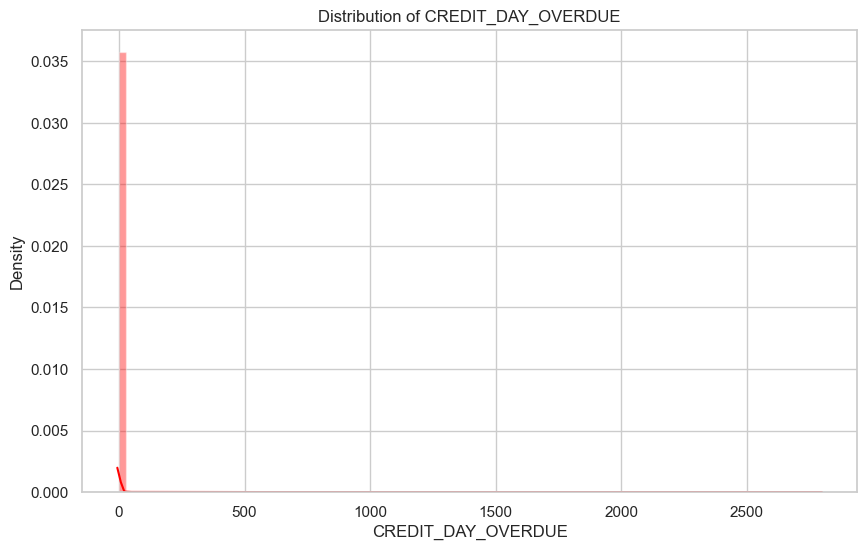

In [97]:
# Distribution de nombre de jours des crédits en retard
plot_b_distribution('CREDIT_DAY_OVERDUE','red')

- La plupart des crédits ont 0 ou prèsque de 0 jours de retard. 
- Le nombre maximum de jours de crédit en retard est d'environ 3000 jours.

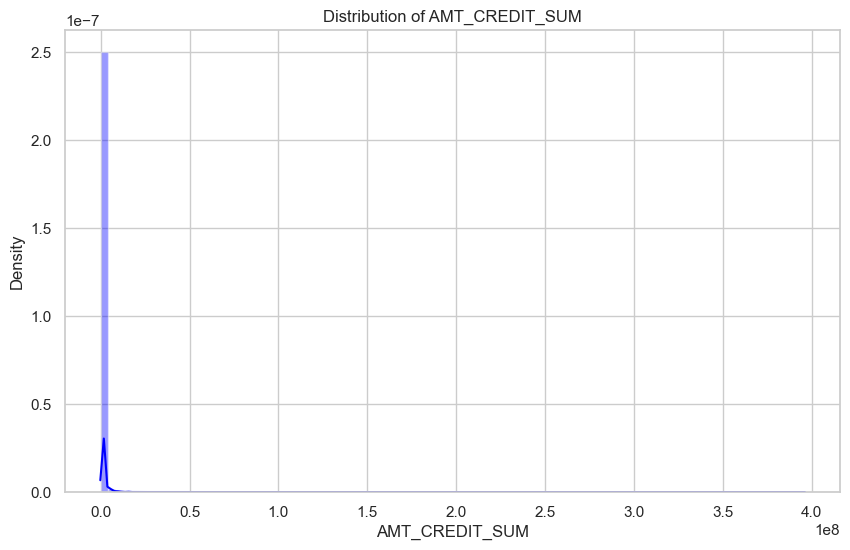

In [98]:
plot_b_distribution('AMT_CREDIT_SUM','blue')

- La distribution de AMT_CREDIT_SUM montre une concentration des crédits pour la plage de somme de crédit 0 !.
- On va supprimer les "outliers" pour mieux voir la distribution autour de 0.
- On va trouver les valeurs aberrante en définissant un un seuil. 

In [91]:
# Source: https://stackoverflow.com/questions/11882393/matplotlib-disregard-outliers-when-plotting (see references)

def is_outlier(points, thresh=3.5):
    """
    Returns a boolean array with True if points are outliers and False 
    otherwise.

    Parameters:
    -----------
        points : An numobservations by numdimensions array of observations
        thresh : The modified z-score to use as a threshold. Observations with
            a modified z-score (based on the median absolute deviation) greater
            than this value will be classified as outliers.

    Returns:
    --------
        mask : A numobservations-length boolean array.

    References:
    ----------
        Boris Iglewicz and David Hoaglin (1993), "Volume 16: How to Detect and
        Handle Outliers", The ASQC Basic References in Quality Control:
        Statistical Techniques, Edward F. Mykytka, Ph.D., Editor. 
    """
    if len(points.shape) == 1:
        points = points[:,None]
    median = np.median(points, axis=0)
    diff = np.sum((points - median)**2, axis=-1)
    diff = np.sqrt(diff)
    med_abs_deviation = np.median(diff)

    modified_z_score = 0.6745 * diff / med_abs_deviation

    return modified_z_score > thresh

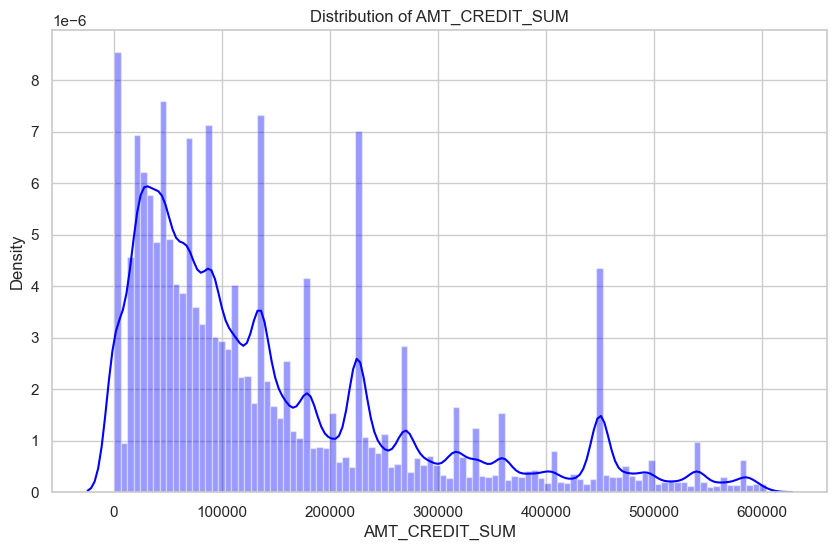

In [92]:
def plot_b_o_distribution(feature,color):
    plt.figure(figsize=(10,6))
    plt.title("Distribution of %s" % feature)
    x = application_bureau_train[feature].dropna()
    filtered = x[~is_outlier(x)]
    sns.distplot(filtered,color=color, kde=True,bins=100)
    plt.show() 

plot_b_o_distribution('AMT_CREDIT_SUM','blue')

- On peut observer que la distribution a plusieurs pics et la concentration maximale des valeurs est d'environ 20000 mais on voit aussi plusieurs autres pics à des valeurs plus élevées.

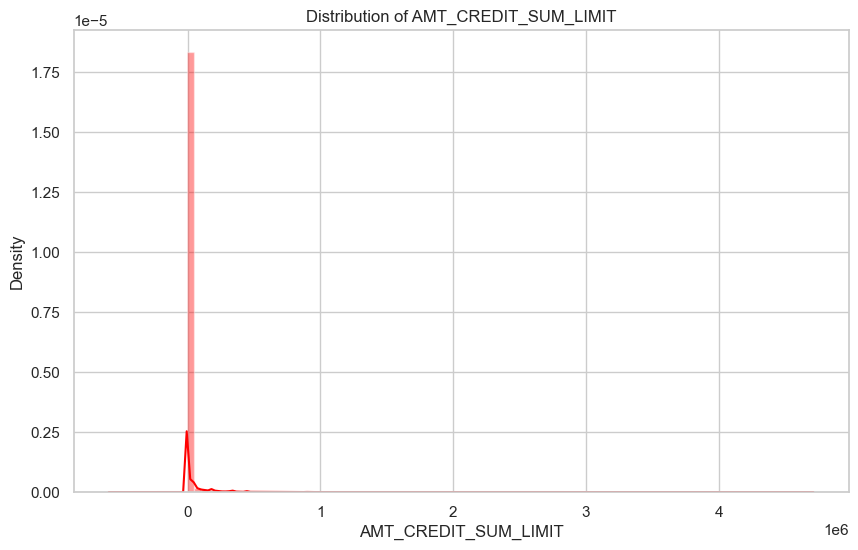

In [99]:
plot_b_distribution('AMT_CREDIT_SUM_LIMIT','red')


### Analyse bivariée de la variable cible vs les variables catégorielles du « bureau_data »

In [100]:
# Plot distribution of multiple features, with TARGET = 1/0 on the same graph
def plot_b_distribution_comp(var,nrow=2):
    
    i = 0
    t1 = application_bureau_train.loc[application_bureau_train['TARGET'] != 0]
    t0 = application_bureau_train.loc[application_bureau_train['TARGET'] == 0]

    sns.set_style('whitegrid')
    plt.figure()
    fig, ax = plt.subplots(nrow,2,figsize=(12,6*nrow))

    for feature in var:
        i += 1
        plt.subplot(nrow,2,i)
        sns.kdeplot(t1[feature], bw=0.5,label="TARGET = 1")
        sns.kdeplot(t0[feature], bw=0.5,label="TARGET = 0")
        plt.ylabel('Density plot', fontsize=12)
        plt.xlabel(feature, fontsize=12)
        locs, labels = plt.xticks()
        plt.tick_params(axis='both', which='major', labelsize=12)
    plt.show();

<Figure size 640x480 with 0 Axes>

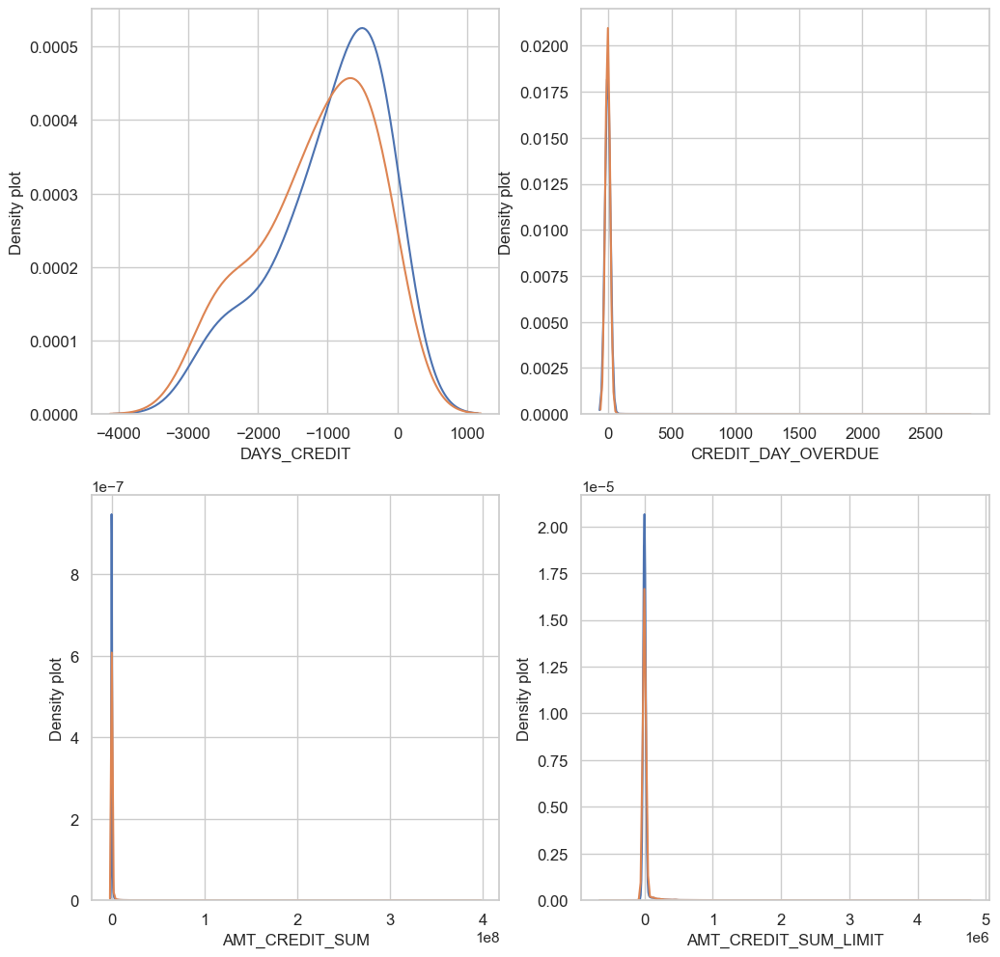

In [101]:
var = ['DAYS_CREDIT','CREDIT_DAY_OVERDUE','AMT_CREDIT_SUM','AMT_CREDIT_SUM_LIMIT']

plot_b_distribution_comp(var, nrow=2)

# 5. Analyse exploratoire de «previous_application_data »

- Le table  "previous_application" contient des informations sur toutes les demandes précédentes des clients auprès de  Home Credit.
- Il y a une ligne pour chaque demande précédente.
- SK_ID_CURR est la clé reliant les données "application_train|test" aux données "previous_application".
- D'abord on va fusionner les deux tables

In [102]:
application_prev_train = train_df.merge(previous_application, left_on='SK_ID_CURR', right_on='SK_ID_CURR', how='inner')

In [103]:
print("The resulting dataframe `application_prev_train` has ",application_prev_train.shape[0]," rows and ", 
      application_prev_train.shape[1]," columns.")

The resulting dataframe `application_prev_train` has  1413646  rows and  159  columns.


### 	- Analyse bivariée de la variable cible vs les variables catégorielles du « previous_application_data »

In [104]:
def plot_p_stats(feature,label_rotation=False,horizontal_layout=True):
    temp = application_prev_train[feature].value_counts()
    df1 = pd.DataFrame({feature: temp.index,'Number of contracts': temp.values})
    # Calculate the percentage of target=1 per category value
    cat_perc = application_prev_train[[feature, 'TARGET']].groupby([feature],as_index=False).mean()
    cat_perc.sort_values(by='TARGET', ascending=False, inplace=True)
    
    if(horizontal_layout):
        fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(12,6))
    else:
        fig, (ax1, ax2) = plt.subplots(nrows=2, figsize=(12,14))
    sns.set_color_codes("pastel")
    s = sns.barplot(ax=ax1, x = feature, y="Number of contracts",data=df1)
    if(label_rotation):
        s.set_xticklabels(s.get_xticklabels(),rotation=90)
    
    s = sns.barplot(ax=ax2, x = feature, y='TARGET', order=cat_perc[feature], data=cat_perc)
    if(label_rotation):
        s.set_xticklabels(s.get_xticklabels(),rotation=90)
    plt.ylabel('Percent of target with value 1 [%]', fontsize=10)
    plt.tick_params(axis='both', which='major', labelsize=10)

    plt.show();

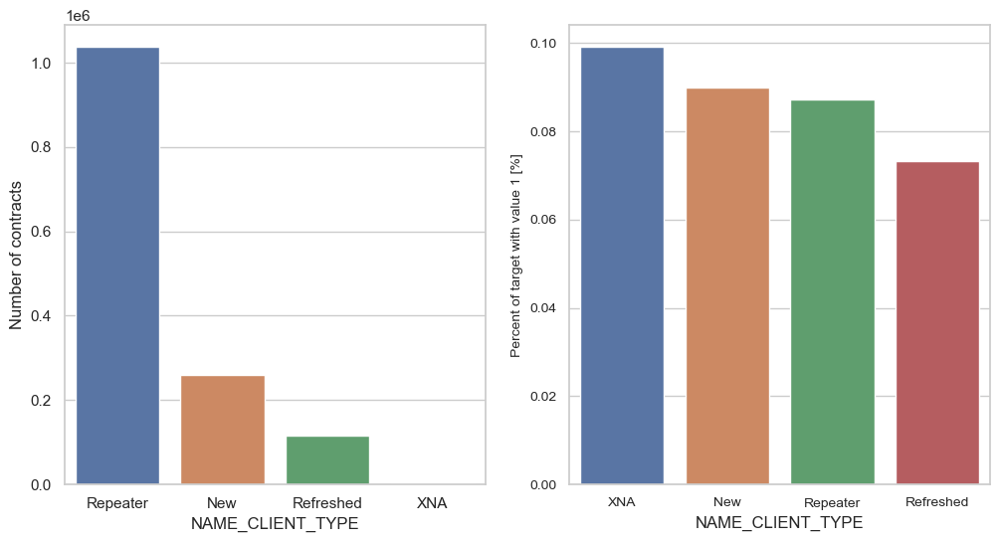

In [105]:
plot_p_stats('NAME_CLIENT_TYPE')

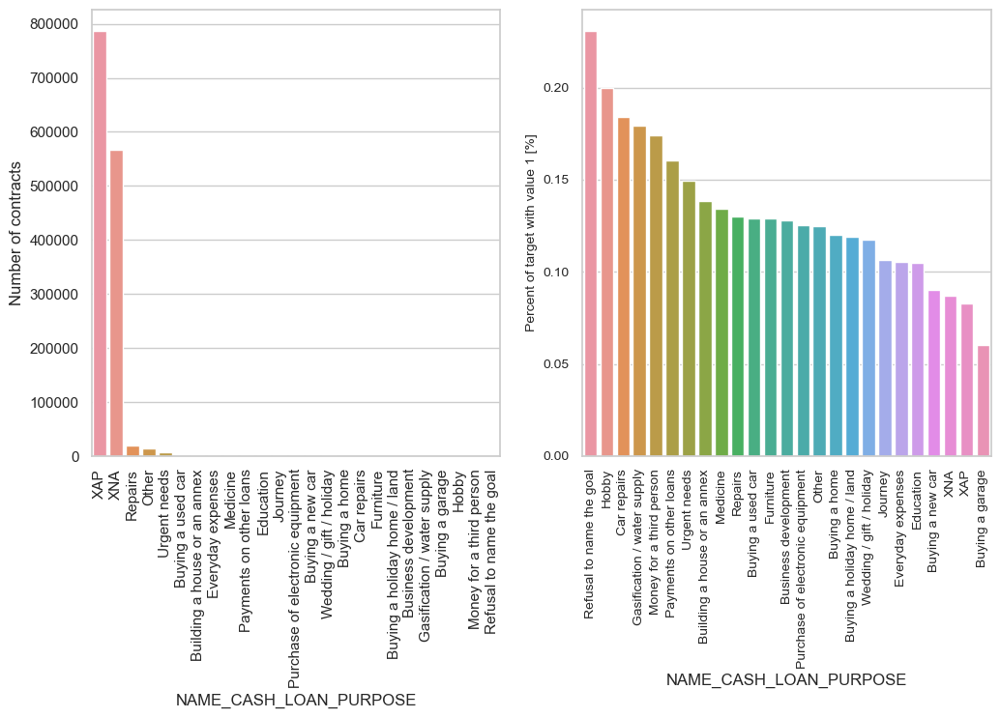

In [106]:
plot_p_stats('NAME_CASH_LOAN_PURPOSE', True, True)

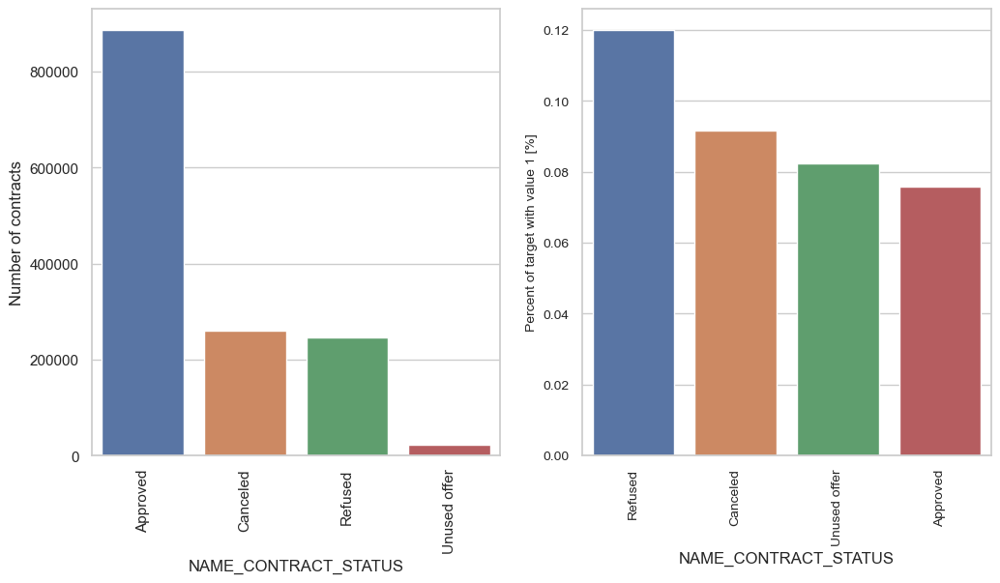

In [107]:
plot_p_stats('NAME_CONTRACT_STATUS', True, True)


- La plupart de contrat des demandeurs de crédit précédentes sont "Approuvé" (plus de 800K), Annulé et Refusé (plus de 200K). 
- Il n'y a très peu de contrant non_utilisé

- En termes de pourcentage des crédit non_remboiursés pour les candidatures en cours, les clients ayant un historique de candidatures précédentes ont les plus grands pourcentages lorsque dans leur historique les statuts de contrat sont Refusé (12 %), suivi de Annlé (moin de 9 %), contrant inutilisée (~8 %) et approuvé (pourcentage le plus faible  avec moins de 8 %).

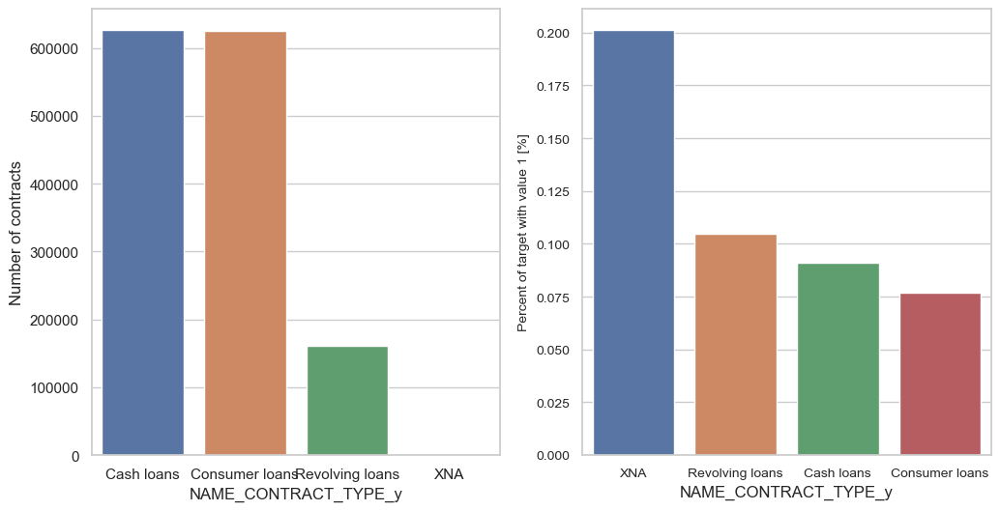

In [108]:
plot_p_stats('NAME_CONTRACT_TYPE_y')


- Il existe trois types de contrats dans les données de demendeurs précédente: "Cash loans", "Consumer loan" , "Revolving loans" . 
- Le pourcentage de prêts non remboursé des demandeurs de crédit précédant  est différent pour le type de contrats de demandes précédentes, diminuant de ~ 10% pour les "Revolving loans", puis ~ 9,5% pour les prêts en espèces et ~ 8% pour les prêts à la consommation.

- A présent on va analyser la corrélation du "TARGET" avec des différentes varaible du table "application_train" nommé "train_df" après les nettoayge.

# 6. Analyse bivariée : la corrélation entre la variable cible et les autres variables 

- Dans cette parties on va analyser la corrélation entre la varible "TARGET" et les autres varaibles des autres tables. 
- On va examiner la corrélation avec coéficient Pearson

## 6.1. « application_train »

In [110]:
fcor= pd.DataFrame(train_df).corr()
cordf= fcor.where(np.triu(np.ones(fcor.shape), k = 1).astype(np.bool))
cordf = cordf.unstack().reset_index()
cordf.columns = ['var1', 'var2', 'Correlation']
cordf.dropna(subset = ['Correlation'], inplace = True)
mat = cordf.sort_values(by = 'Correlation', ascending = False)
maxc = mat[mat['Correlation'] > 0.7]
maxc

,var1,var2,Correlation
6776,YEARS_BUILD_MEDI,YEARS_BUILD_AVG,0.998495
8314,OBS_60_CNT_SOCIAL_CIRCLE,OBS_30_CNT_SOCIAL_CIRCLE,0.998489
7316,FLOORSMIN_MEDI,FLOORSMIN_AVG,0.997241
7208,FLOORSMAX_MEDI,FLOORSMAX_AVG,0.997034
7100,ENTRANCES_MEDI,ENTRANCES_AVG,0.996886
6992,ELEVATORS_MEDI,ELEVATORS_AVG,0.996099
6884,COMMONAREA_MEDI,COMMONAREA_AVG,0.995978
7640,LIVINGAREA_MEDI,LIVINGAREA_AVG,0.995596
6452,APARTMENTS_MEDI,APARTMENTS_AVG,0.995081
6560,BASEMENTAREA_MEDI,BASEMENTAREA_AVG,0.994317


In [111]:
# Find correlations with the target and sort
def target_correlation (df):
    correlations = df.corr()['TARGET'].sort_values(ascending=False)
    return correlations

In [112]:
def heatmap_correlation(df) :
    corr = df.corr()
    plt.figure(figsize=(30,30))
    sns.heatmap(corr , annot=True, linewidths=.2, cmap="YlGnBu");

In [113]:
# Afficher la correlation entre les variables numérique et le varaible TARGET 
print(color.BOLD + color.BLUE + 'TOP_10 Positive Correlations:\n'+ color.END)
print(train_df.corr()['TARGET']. sort_values().tail(20))
print('******')
print(color.BOLD + color.RED +'TOP_10 Negative Correlations:\n'+ color.END)
print(train_df.corr()['TARGET']. sort_values().head(20))


TOP_10 Positive Correlations:

CNT_FAM_MEMBERS                0.009310
CNT_CHILDREN                   0.019189
AMT_REQ_CREDIT_BUREAU_YEAR     0.019934
FLAG_WORK_PHONE                0.028533
DEF_60_CNT_SOCIAL_CIRCLE       0.031295
DEF_30_CNT_SOCIAL_CIRCLE       0.032261
LIVE_CITY_NOT_WORK_CITY        0.032517
OWN_CAR_AGE                    0.037611
DAYS_REGISTRATION              0.041976
FLAG_DOCUMENT_3                0.044341
REG_CITY_NOT_LIVE_CITY         0.044394
FLAG_EMP_PHONE                 0.045984
REG_CITY_NOT_WORK_CITY         0.050992
DAYS_ID_PUBLISH                0.051457
DAYS_LAST_PHONE_CHANGE         0.054901
REGION_RATING_CLIENT           0.058901
REGION_RATING_CLIENT_W_CITY    0.060895
DAYS_EMPLOYED                  0.074957
DAYS_BIRTH                     0.078242
TARGET                         1.000000
Name: TARGET, dtype: float64
******
TOP_10 Negative Correlations:

EXT_SOURCE_3                 -0.178926
EXT_SOURCE_2                 -0.160471
EXT_SOURCE_1            

**On va examiner quelques-unes des corrélations les plus significatives :** 
- DAYS_BIRTH est la corrélation la plus élevée.
- 'Ext_source avec la correlation la plus faible

In [114]:
building_normal_info_list = ['APARTMENTS_AVG','BASEMENTAREA_AVG','YEARS_BEGINEXPLUATATION_AVG','YEARS_BUILD_AVG',
'COMMONAREA_AVG','ELEVATORS_AVG','ENTRANCES_AVG','FLOORSMAX_AVG','FLOORSMIN_AVG','LANDAREA_AVG','LIVINGAPARTMENTS_AVG',
'LIVINGAREA_AVG','NONLIVINGAPARTMENTS_AVG','NONLIVINGAREA_AVG','APARTMENTS_MODE','BASEMENTAREA_MODE',
'YEARS_BEGINEXPLUATATION_MODE','YEARS_BUILD_MODE','COMMONAREA_MODE','ELEVATORS_MODE',
'ENTRANCES_MODE','FLOORSMAX_MODE','FLOORSMIN_MODE','LANDAREA_MODE',
'LIVINGAPARTMENTS_MODE','LIVINGAREA_MODE','NONLIVINGAPARTMENTS_MODE','NONLIVINGAREA_MODE','APARTMENTS_MEDI',
'BASEMENTAREA_MEDI','YEARS_BEGINEXPLUATATION_MEDI','YEARS_BUILD_MEDI','COMMONAREA_MEDI','ELEVATORS_MEDI',
'ENTRANCES_MEDI','FLOORSMAX_MEDI','FLOORSMIN_MEDI','LANDAREA_MEDI','LIVINGAPARTMENTS_MEDI',
'LIVINGAREA_MEDI','NONLIVINGAPARTMENTS_MEDI','NONLIVINGAREA_MEDI','FONDKAPREMONT_MODE',
'HOUSETYPE_MODE','TOTALAREA_MODE','WALLSMATERIAL_MODE','EMERGENCYSTATE_MODE' ]

In [115]:
df1 = train_df[building_normal_info_list]
df1['TARGET']= train_df['TARGET']

In [116]:
target_correlation(df1).head(10)


TARGET                          1.000000
NONLIVINGAPARTMENTS_MODE       -0.001557
NONLIVINGAPARTMENTS_MEDI       -0.002758
NONLIVINGAPARTMENTS_AVG        -0.003177
YEARS_BEGINEXPLUATATION_MODE   -0.009036
YEARS_BEGINEXPLUATATION_AVG    -0.009727
YEARS_BEGINEXPLUATATION_MEDI   -0.009993
LANDAREA_MODE                  -0.010176
LANDAREA_AVG                   -0.010887
LANDAREA_MEDI                  -0.011258
Name: TARGET, dtype: float64

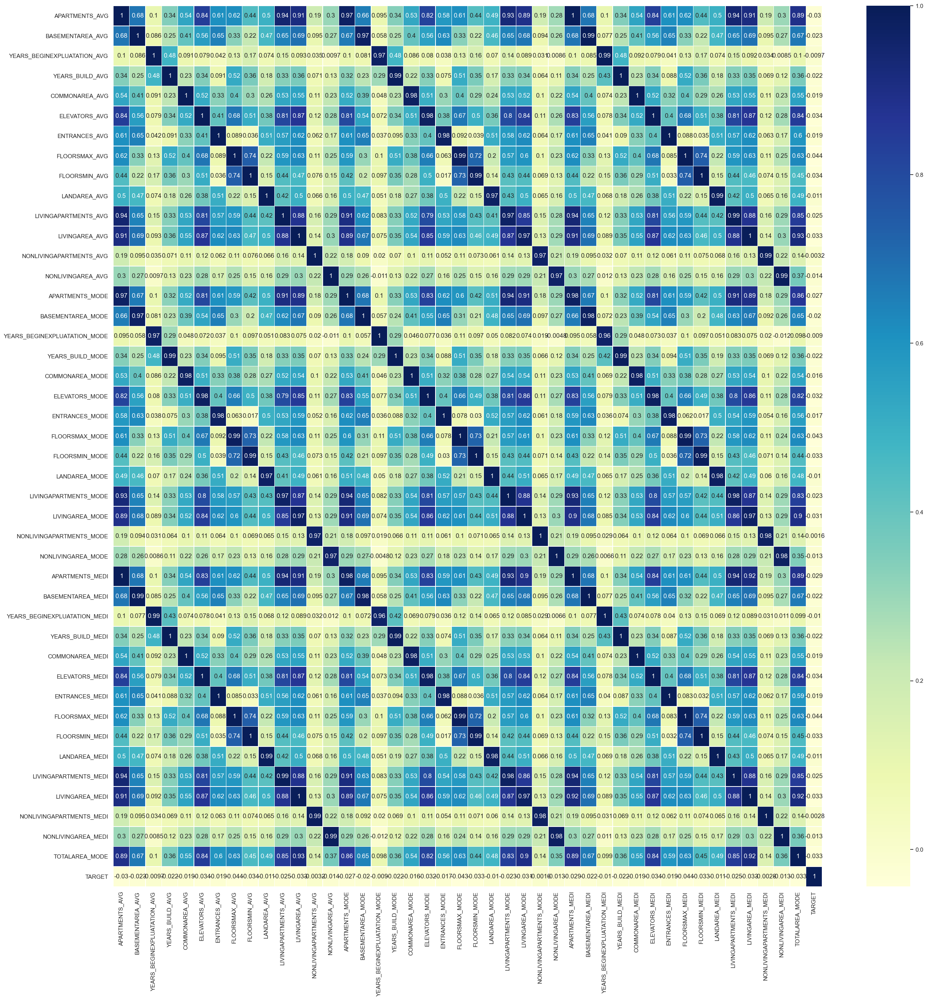

In [117]:
heatmap_correlation(df1)

In [118]:
die_client_doc = ['FLAG_DOCUMENT_2','FLAG_DOCUMENT_3','FLAG_DOCUMENT_4','FLAG_DOCUMENT_5','FLAG_DOCUMENT_6',
'FLAG_DOCUMENT_7','FLAG_DOCUMENT_8','FLAG_DOCUMENT_9','FLAG_DOCUMENT_10','FLAG_DOCUMENT_11','FLAG_DOCUMENT_12',
'FLAG_DOCUMENT_13','FLAG_DOCUMENT_14','FLAG_DOCUMENT_15','FLAG_DOCUMENT_16','FLAG_DOCUMENT_17','FLAG_DOCUMENT_18',
'FLAG_DOCUMENT_19','FLAG_DOCUMENT_20','FLAG_DOCUMENT_21']

In [119]:
df2 = train_df[die_client_doc]
df2['TARGET']= train_df['TARGET']

In [121]:
target_correlation (df2).head(10)

TARGET              1.000000
FLAG_DOCUMENT_3     0.044341
FLAG_DOCUMENT_2     0.005417
FLAG_DOCUMENT_21    0.003709
FLAG_DOCUMENT_20    0.000215
FLAG_DOCUMENT_5    -0.000316
FLAG_DOCUMENT_12   -0.000756
FLAG_DOCUMENT_19   -0.001358
FLAG_DOCUMENT_10   -0.001414
FLAG_DOCUMENT_7    -0.001520
Name: TARGET, dtype: float64

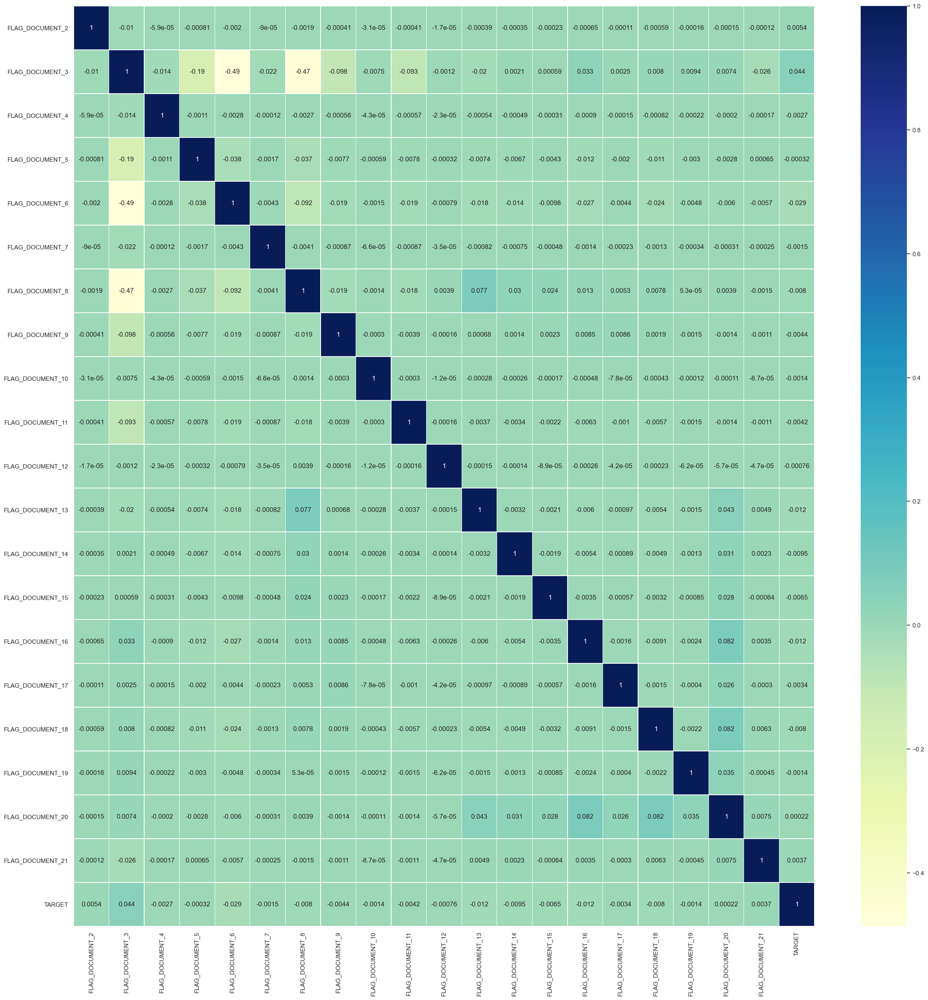

In [122]:
heatmap_correlation(df2)

In [124]:
AMT_REQ_CREDIT_BUREAU_list = ['AMT_REQ_CREDIT_BUREAU_HOUR','AMT_REQ_CREDIT_BUREAU_DAY','AMT_REQ_CREDIT_BUREAU_WEEK',
'AMT_REQ_CREDIT_BUREAU_MON','AMT_REQ_CREDIT_BUREAU_QRT','AMT_REQ_CREDIT_BUREAU_YEAR']

In [125]:
df3 = train_df[AMT_REQ_CREDIT_BUREAU_list]
df3['TARGET']= train_df['TARGET']

In [126]:
target_correlation (df3).head(10)

TARGET                        1.000000
AMT_REQ_CREDIT_BUREAU_YEAR    0.019934
AMT_REQ_CREDIT_BUREAU_DAY     0.002704
AMT_REQ_CREDIT_BUREAU_HOUR    0.000930
AMT_REQ_CREDIT_BUREAU_WEEK    0.000787
AMT_REQ_CREDIT_BUREAU_QRT    -0.002022
AMT_REQ_CREDIT_BUREAU_MON    -0.012460
Name: TARGET, dtype: float64

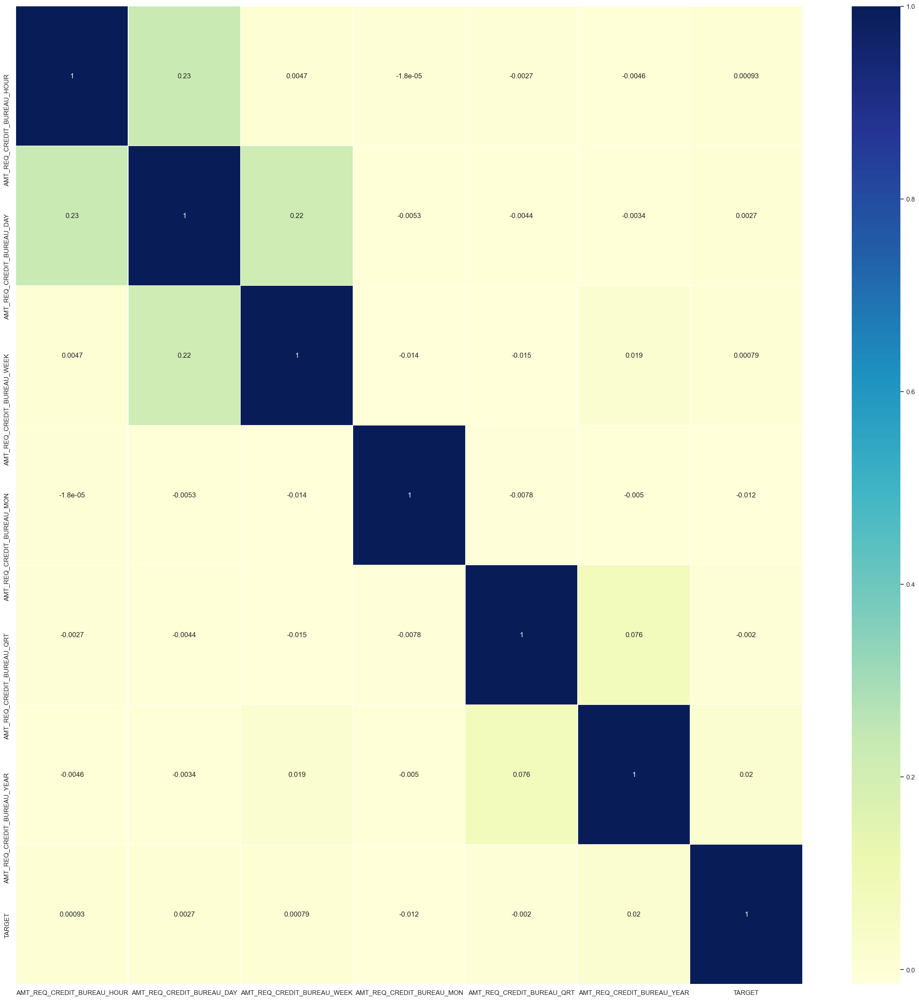

In [127]:
heatmap_correlation(df3)

In [128]:

social_surroundings_list = ['OBS_30_CNT_SOCIAL_CIRCLE','DEF_30_CNT_SOCIAL_CIRCLE','OBS_60_CNT_SOCIAL_CIRCLE',
                            'DEF_60_CNT_SOCIAL_CIRCLE','DAYS_LAST_PHONE_CHANGE']

In [129]:
df4 = train_df[social_surroundings_list]
df4['TARGET']= train_df['TARGET']


In [130]:
target_correlation (df4).head(10)

TARGET                      1.000000
DAYS_LAST_PHONE_CHANGE      0.054901
DEF_30_CNT_SOCIAL_CIRCLE    0.032261
DEF_60_CNT_SOCIAL_CIRCLE    0.031295
OBS_30_CNT_SOCIAL_CIRCLE    0.009136
OBS_60_CNT_SOCIAL_CIRCLE    0.009027
Name: TARGET, dtype: float64

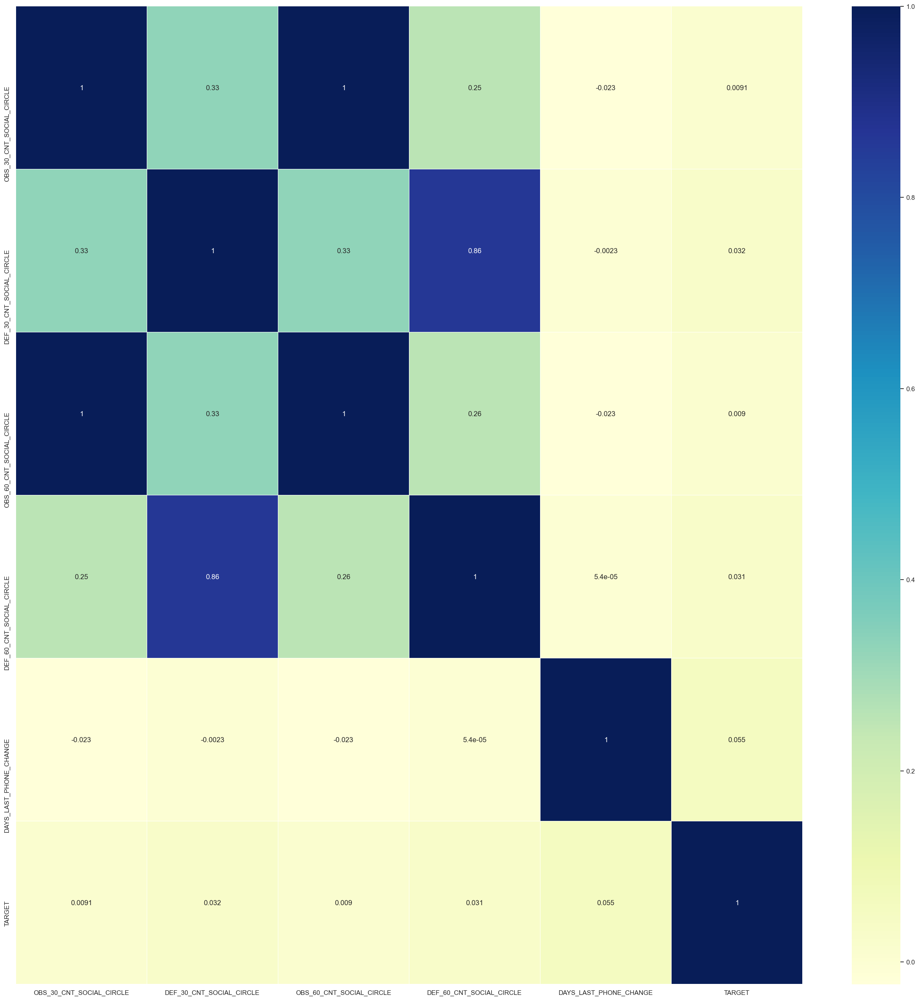

In [131]:
heatmap_correlation(df4)


In [132]:
external_score_list = ['EXT_SOURCE_1','EXT_SOURCE_2','EXT_SOURCE_3']

In [133]:
df5 = train_df[external_score_list]
df5['TARGET']= train_df['TARGET']

In [134]:
target_correlation (df5).head(10)

TARGET          1.000000
EXT_SOURCE_1   -0.155317
EXT_SOURCE_2   -0.160471
EXT_SOURCE_3   -0.178926
Name: TARGET, dtype: float64

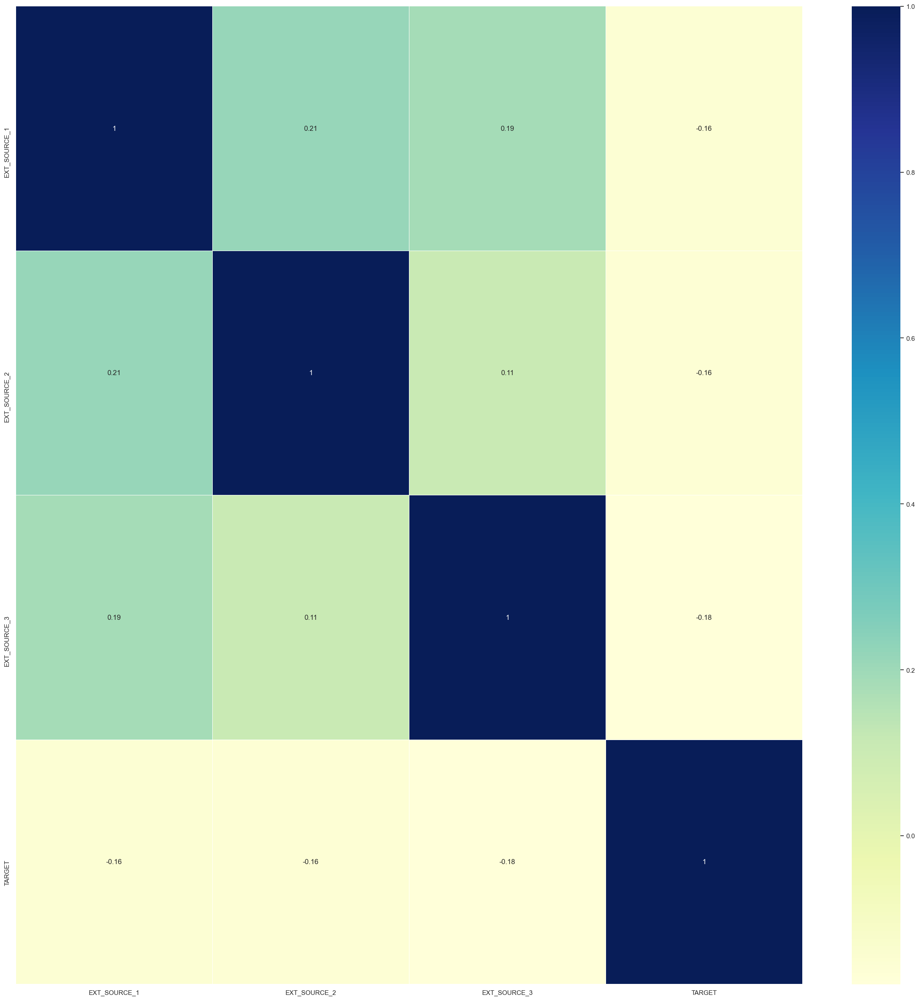

In [135]:
heatmap_correlation(df5)

In [136]:
Flag_list = ['REG_REGION_NOT_LIVE_REGION','REG_REGION_NOT_WORK_REGION','LIVE_REGION_NOT_WORK_REGION',
'REG_CITY_NOT_LIVE_CITY','REG_CITY_NOT_WORK_CITY','LIVE_CITY_NOT_WORK_CITY']

In [137]:
df6 = train_df[Flag_list]
df6['TARGET']= train_df['TARGET']

In [138]:
target_correlation (df6).head(10)

TARGET                         1.000000
REG_CITY_NOT_WORK_CITY         0.050992
REG_CITY_NOT_LIVE_CITY         0.044394
LIVE_CITY_NOT_WORK_CITY        0.032517
REG_REGION_NOT_WORK_REGION     0.006941
REG_REGION_NOT_LIVE_REGION     0.005575
LIVE_REGION_NOT_WORK_REGION    0.002819
Name: TARGET, dtype: float64

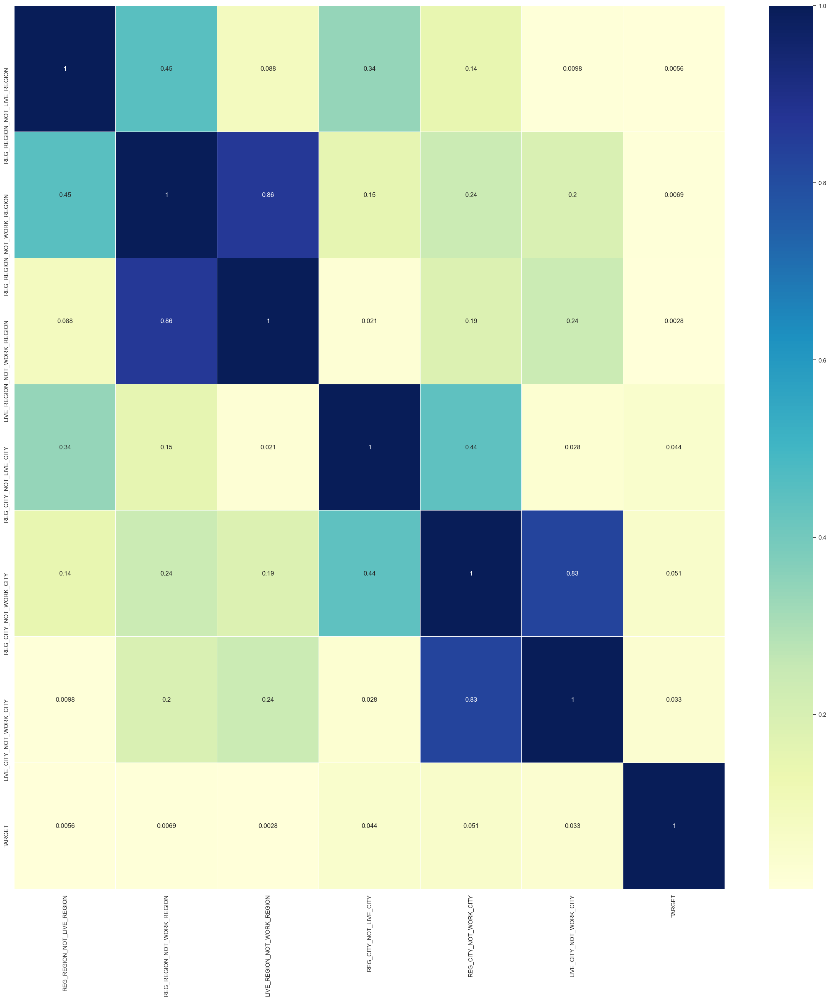

In [139]:
heatmap_correlation(df6)

In [140]:
AMT_list = ['AMT_INCOME_TOTAL','AMT_CREDIT','AMT_ANNUITY','AMT_GOODS_PRICE']

In [141]:
df7 = train_df[AMT_list]
df7['TARGET']= train_df['TARGET']

In [142]:
target_correlation (df7).head(10)

TARGET              1.000000
AMT_INCOME_TOTAL   -0.003982
AMT_ANNUITY        -0.012818
AMT_CREDIT         -0.030371
AMT_GOODS_PRICE    -0.039647
Name: TARGET, dtype: float64

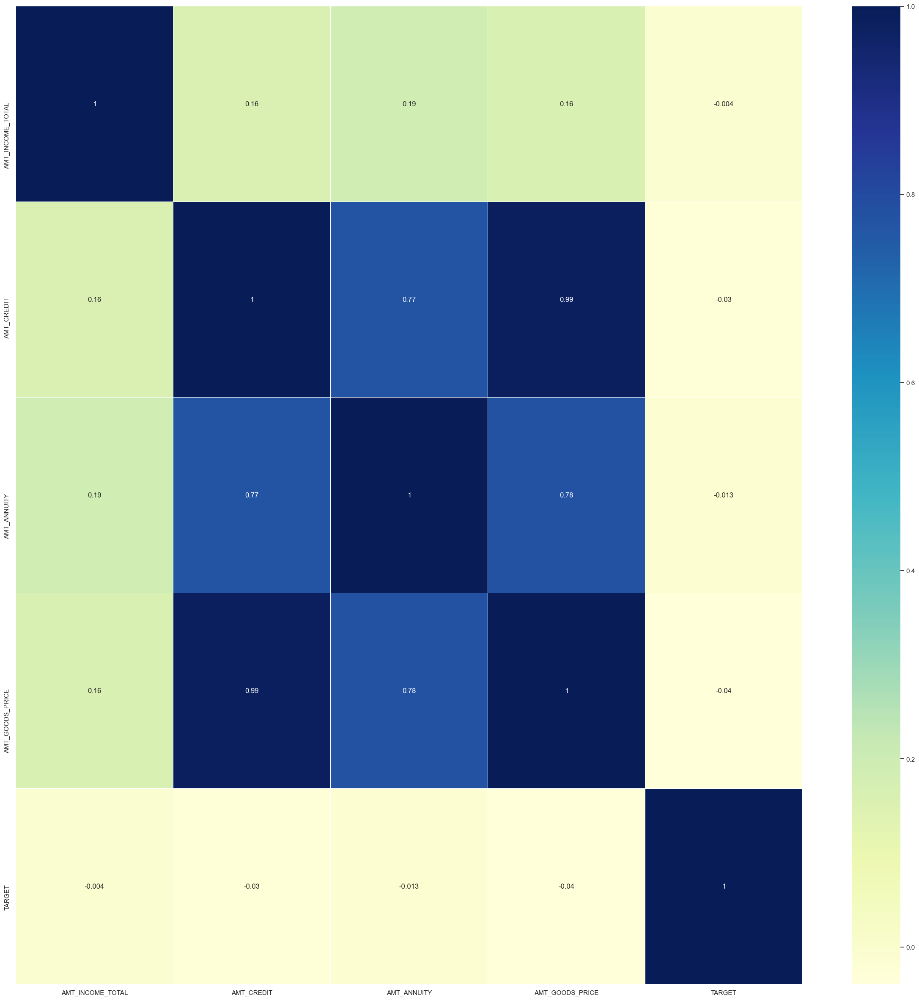

In [143]:
heatmap_correlation(df7)

In [144]:
days_list = ['DAYS_BIRTH','DAYS_EMPLOYED','DAYS_REGISTRATION','DAYS_ID_PUBLISH' ]

In [145]:
df8 = train_df[days_list]
df8['TARGET']= train_df['TARGET']

In [146]:
target_correlation (df8).head(10)

TARGET               1.000000
DAYS_BIRTH           0.078242
DAYS_EMPLOYED        0.074957
DAYS_ID_PUBLISH      0.051457
DAYS_REGISTRATION    0.041976
Name: TARGET, dtype: float64

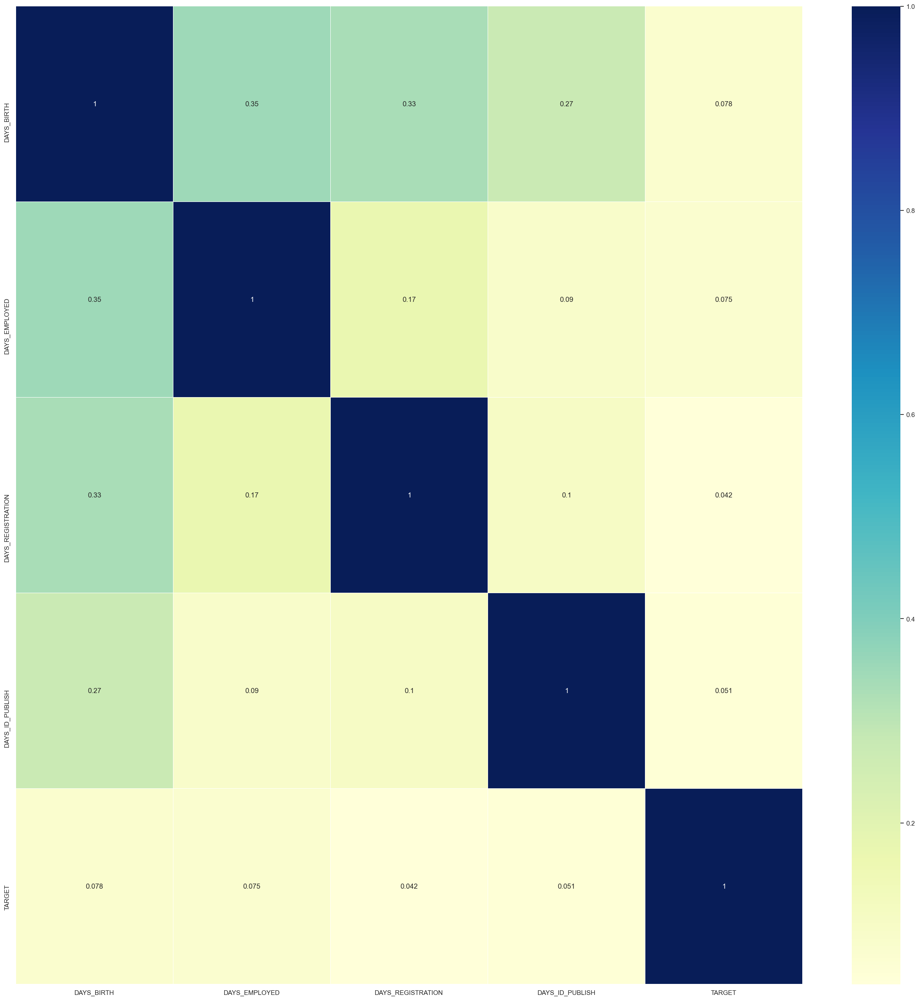

In [147]:
heatmap_correlation(df8)

###  6.1.1 Corrélation entre l'age d'un client et le remboursement du prêt

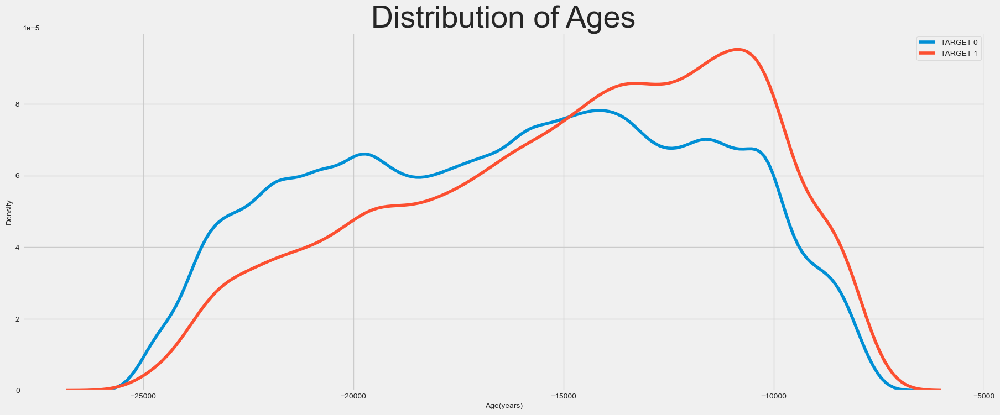

In [167]:
#Graphing…
plt.style.use('fivethirtyeight')
plt.rcParams.update(
    {
     'xtick.labelsize':10,
     'ytick.labelsize':10,
     'axes.labelsize': 10,
     'legend.fontsize': 10,
    })


plt.figure(figsize = (20, 8))
sns.kdeplot(application_train[application_train['TARGET'] == 0]['DAYS_BIRTH'], label = 'TARGET 0')
sns.kdeplot(application_train[application_train['TARGET'] == 1]['DAYS_BIRTH'], label = 'TARGET 1')

plt.legend()
plt.xlabel('Age(years)')
plt.ylabel('Density') 
plt.title('Distribution of Ages', fontsize= 40)
plt.show()

  - **Target == 1  s'incline vers les clients plus jeunes**. Bien qu'il ne s'agisse pas d'une corrélation significative (coefficient de corrélation de -0,07), cette variable sera probablement utile dans notre modélisation. 
  - Nous allons **analyer la relation entre Target et l'age des client** par leur incapacité moyenne à rembourser les crédits par tranche d'âge.

In [168]:
# Age information into a separate dataframe
age_data = train_df[['TARGET', 'DAYS_BIRTH', 'AGE_CLIENT']]


# Bin the age data
age_data['YEARS_BINNED'] = pd.cut(age_data['AGE_CLIENT'], bins = np.linspace(20, 70, num = 11))
age_data[['TARGET','YEARS_BINNED']].head(10)

,TARGET,YEARS_BINNED
0,1,"(25.0, 30.0]"
1,0,"(45.0, 50.0]"
2,0,"(50.0, 55.0]"
3,0,"(50.0, 55.0]"
4,0,"(50.0, 55.0]"
5,0,"(45.0, 50.0]"
6,0,"(35.0, 40.0]"
7,0,"(50.0, 55.0]"
8,0,"(55.0, 60.0]"
9,0,"(35.0, 40.0]"


In [169]:
# groupment par le bin et le moyenne de l'age
age_groups  = age_data.groupby('YEARS_BINNED').mean()
age_groups

,TARGET,DAYS_BIRTH,AGE_CLIENT
YEARS_BINNED,,,
"(20.0, 25.0]",0.123036,-8532.795625,23.377522
"(25.0, 30.0]",0.111442,-10155.219690,27.822520
"(30.0, 35.0]",0.102814,-11854.848377,32.479037
"(35.0, 40.0]",0.089416,-13707.908041,37.555912
"(40.0, 45.0]",0.078491,-15497.661233,42.459346
"(45.0, 50.0]",0.074171,-17323.900441,47.462741
"(50.0, 55.0]",0.066968,-19196.494791,52.593136
"(55.0, 60.0]",0.055316,-20984.285455,57.491193
"(60.0, 65.0]",0.052737,-22780.547460,62.412459


Text(0.5, 1.0, 'Defaut de remboursement par tranche age')

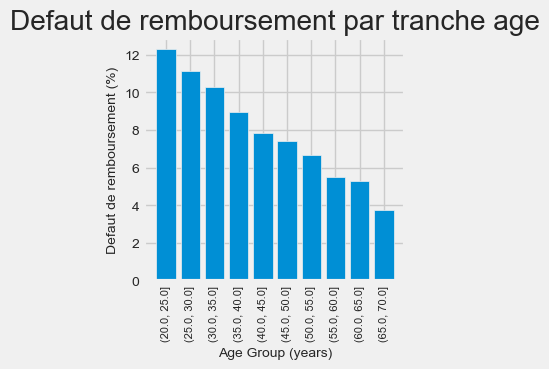

In [170]:
plt.figure(figsize = (3, 3))

# Representation des tranche d'age par le moyenne de Target
plt.bar(age_groups.index.astype(str), 100 * age_groups['TARGET'])

# Plot labeling
plt.xticks(rotation = 90, fontsize= 8)
plt.xlabel('Age Group (years)')
plt.ylabel('Defaut de remboursement (%)')
plt.title('Defaut de remboursement par tranche age')

**Les cleints jeuns sont plus susceptibles de ne pas rembourser le prêt !**
- Le taux d'impayés est supérieur à 10 % pour les trois tranches d'âge les plus jeunes et inférieur à 5 % pour la tranche d'âge la plus élevée.

### 6.1.2. Corrélation entre les "external sources" et le remboursement du prêt

- Les 3 variables avec les corrélations négatives les plus fortes avec TARGER sont EXT_SOURCE_1, EXT_SOURCE_2 et EXT_SOURCE_3. 


In [152]:
ext_source = ['EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3']
app_train_desc[app_train_desc['Row'].isin(ext_source)]

,Unnamed: 0,Table,Row,Description,Special
41,44,application_{train|test}.csv,EXT_SOURCE_1,Normalized score from external data source,normalized
42,45,application_{train|test}.csv,EXT_SOURCE_2,Normalized score from external data source,normalized
43,46,application_{train|test}.csv,EXT_SOURCE_3,Normalized score from external data source,normalized


- **Selon la documentation, ces fonctionnalités représentent un "Normalized score from external data source".**
- On ne peut pas savoir de quoi il s'agit. 
- Mais il peut s'agir d'une sorte de cote de crédit cumulative établie à l'aide de nombreuses sources de données.


In [153]:
train_df[['TARGET', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'AGE_CLIENT']]

,TARGET,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,AGE_CLIENT
0,1,0.083037,0.262949,0.139376,25.920548
1,0,0.311267,0.622246,NaN,45.931507
2,0,NaN,0.555912,0.729567,52.180822
3,0,NaN,0.650442,NaN,52.068493
4,0,NaN,0.322738,NaN,54.608219
...,...,...,...,...,...
307506,0,0.145570,0.681632,NaN,25.553425
307507,0,NaN,0.115992,NaN,56.917808
307508,0,0.744026,0.535722,0.218859,41.002740
307509,1,NaN,0.514163,0.661024,32.769863


In [154]:
#  Afficher la corrélation des varibles EXT_SOURCE avec l'age des client et le TARGET
ext_data = train_df[['TARGET', 'EXT_SOURCE_1', 'EXT_SOURCE_2', 'EXT_SOURCE_3', 'AGE_CLIENT']]
ext_data_corrs = ext_data.corr()
ext_data_corrs

,TARGET,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,AGE_CLIENT
TARGET,1.000000,-0.155317,-0.160471,-0.178926,-0.078242
EXT_SOURCE_1,-0.155317,1.000000,0.213982,0.186845,0.600621
EXT_SOURCE_2,-0.160471,0.213982,1.000000,0.109182,0.092009
EXT_SOURCE_3,-0.178926,0.186845,0.109182,1.000000,0.205465
AGE_CLIENT,-0.078242,0.600621,0.092009,0.205465,1.000000


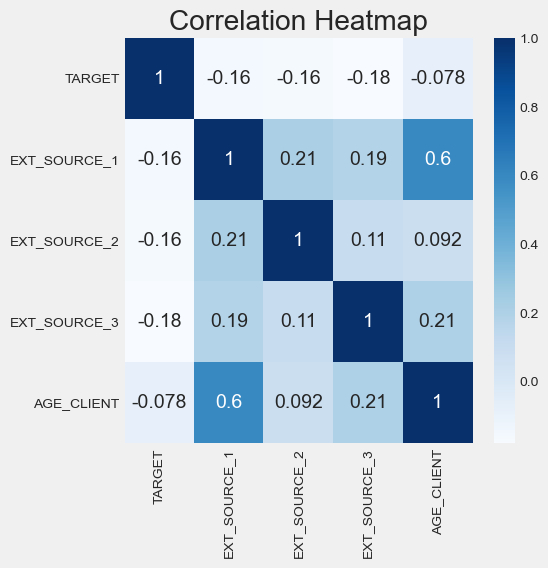

In [155]:
plt.figure(figsize = (5, 5))

# Heatmap de correlations
sns.heatmap(ext_data_corrs, cmap="Blues", annot = True)
plt.title('Correlation Heatmap');

- Les trois varibles 'EXT_SOURCE' ont des corrélations négatives avec TARGET, 
- Cela signifie que plus que la valeur de EXT_SOURCE augmente, plus le client est susceptible de rembourser le prêt. 
- Nous pouvons également voir que DAYS_BIRTH est positivement corrélé avec EXT_SOURCE_1 . 

In [156]:
def plot_distribution2(feature, title):
    plt.figure(figsize=(20,6))

    t0 = train_df.loc[train_df['TARGET'] == 0]
    t1 = train_df.loc[train_df['TARGET'] == 1]

    
    sns.kdeplot(t0[feature].dropna(), color='blue', label="TARGET = 0")
    sns.kdeplot(t1[feature].dropna(), color='red', label="TARGET = 1")
    plt.title(title, fontsize= 45)
    plt.ylabel('')
    plt.legend()
    plt.show() 

- **La varible "EXT_SOURCE_3" affiche la plus grande différence entre les deux valeurs de "TARGET".**
- On peut constater que EXT_SOURCE_3 a une certaine relation avec la probabilité qu'un cleint rembourse un prêt. 
- La relation n'est pas très forte (en fait elles sont toutes considérées comme très faibles, mais ces variables seront tout de même utiles pour savoir si un client rembourse le pret.

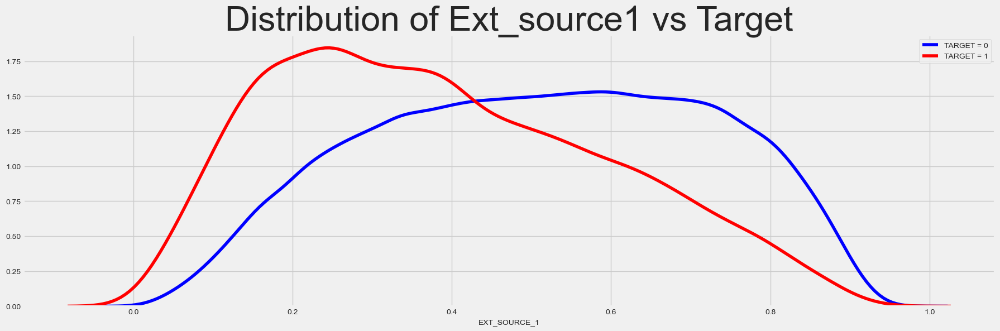

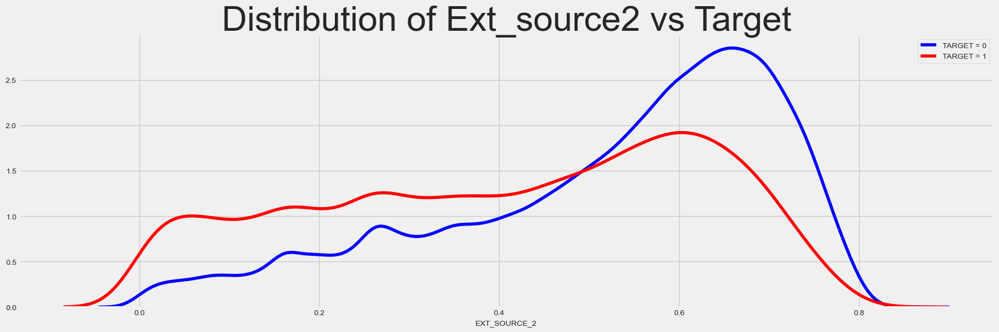

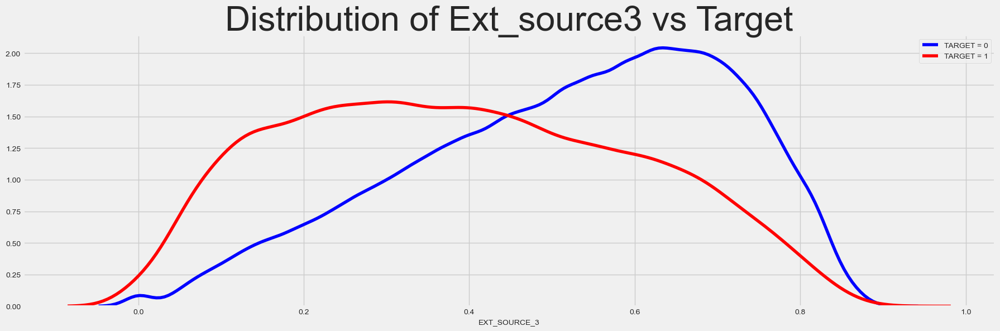

In [157]:
plot_distribution_comp('EXT_SOURCE_1', 'Distribution of Ext_source1 vs Target')
plot_distribution_comp('EXT_SOURCE_2', 'Distribution of Ext_source2 vs Target')
plot_distribution_comp('EXT_SOURCE_3', 'Distribution of Ext_source3 vs Target')

In [158]:
bureau_list = ['CREDIT_ACTIVE','CREDIT_CURRENCY','DAYS_CREDIT','CREDIT_DAY_OVERDUE',
'DAYS_CREDIT_ENDDATE','DAYS_ENDDATE_FACT','AMT_CREDIT_MAX_OVERDUE','CNT_CREDIT_PROLONG','AMT_CREDIT_SUM','AMT_CREDIT_SUM_DEBT',
'AMT_CREDIT_SUM_LIMIT','AMT_CREDIT_SUM_OVERDUE','CREDIT_TYPE','DAYS_CREDIT_UPDATE','AMT_ANNUITY','SK_ID_CURR']

In [159]:
df_b = bureau[bureau_list]
df_b = df_b.merge(application_train[['TARGET','SK_ID_CURR']], on = 'SK_ID_CURR', how = 'left')

In [160]:

target_correlation (df_b).head(10)

TARGET                    1.000000
DAYS_CREDIT               0.061556
DAYS_CREDIT_UPDATE        0.041076
DAYS_ENDDATE_FACT         0.039057
DAYS_CREDIT_ENDDATE       0.026497
AMT_CREDIT_SUM_OVERDUE    0.006253
CREDIT_DAY_OVERDUE        0.002652
AMT_CREDIT_SUM_DEBT       0.002539
AMT_CREDIT_MAX_OVERDUE    0.001587
CNT_CREDIT_PROLONG        0.001523
Name: TARGET, dtype: float64

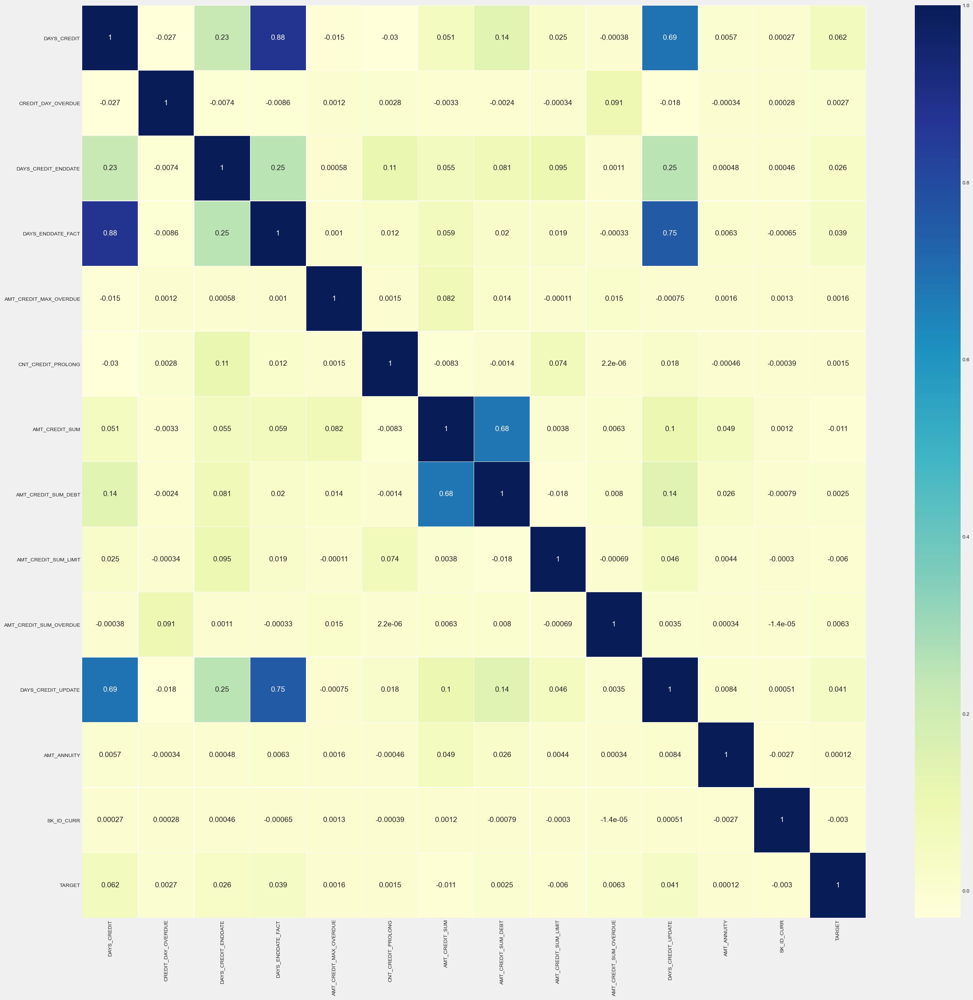

In [161]:
heatmap_correlation(df_b)

- A présent nous allons analyser la corrélaation entre "Target" et les varaibles des autres tables

## 6.2. « credit_card_balance »

- Le table "credit_card_balance" contint des données mensuelles sur les cartes de crédit précédentes que les clients ont eues avec Home Credit. 
- Chaque ligne correspond à un mois du solde d'une carte de crédit, et une seule carte de crédit peut avoir plusieurs lignes.
- On va fusionner ce table avec train_df pour analyser la corrélation entre Target et les varaibles de "credit_card_balance"

In [164]:
df_c = credit_card_balance
df_c = df_c.merge(train_df[['TARGET','SK_ID_CURR']], on = 'SK_ID_CURR', how = 'left')

In [165]:
target_correlation (df_c).head(10)

TARGET                      1.000000
AMT_BALANCE                 0.050098
AMT_TOTAL_RECEIVABLE        0.049839
AMT_RECIVABLE               0.049803
AMT_RECEIVABLE_PRINCIPAL    0.049692
AMT_INST_MIN_REGULARITY     0.039798
CNT_DRAWINGS_ATM_CURRENT    0.038437
CNT_DRAWINGS_CURRENT        0.037793
MONTHS_BALANCE              0.035695
CNT_DRAWINGS_POS_CURRENT    0.029536
Name: TARGET, dtype: float64

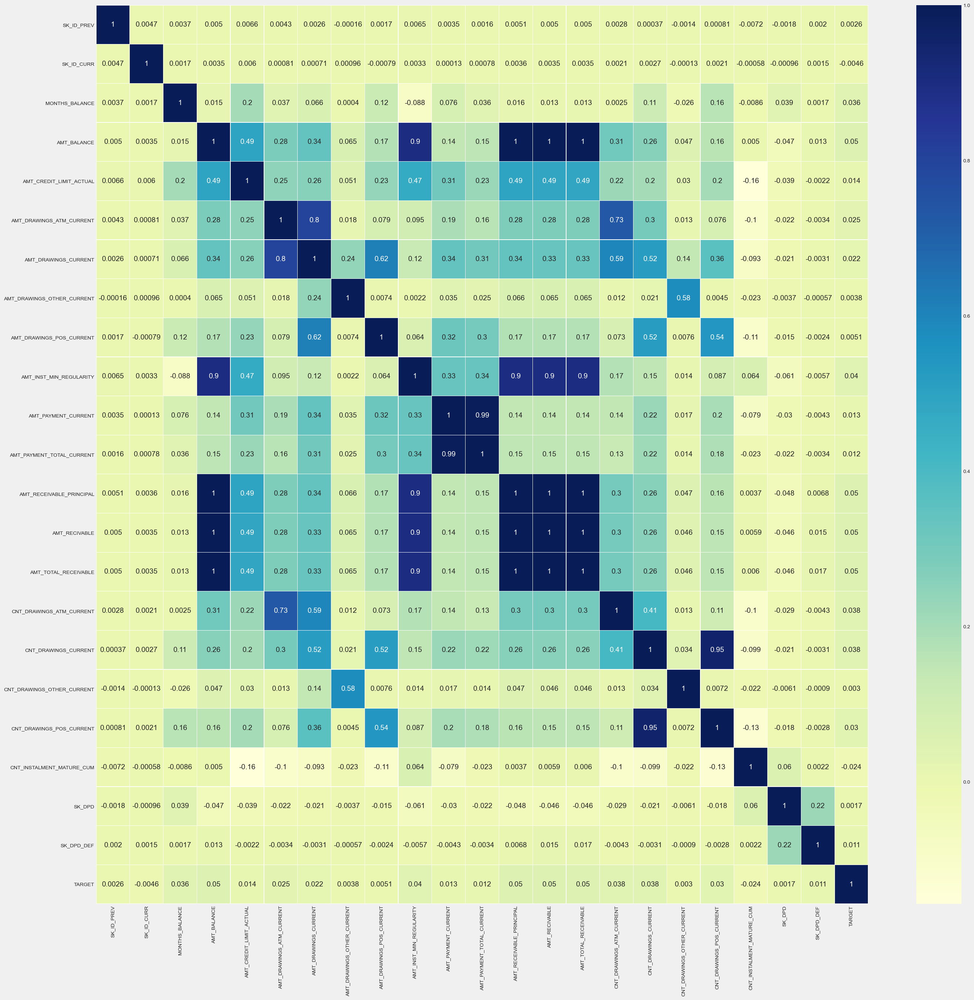

In [171]:
heatmap_correlation(df_c)

## 	6.3. «  installement_payments »

- Le table "installement_payments" contient l'historique des prêts remboursés. 
- Il y a une ligne pour chaque repaiement effectué et une ligne pour chaque non_paiement

In [172]:
df_i = installments_payments
df_i = df_i.merge(train_df[['TARGET','SK_ID_CURR']], on = 'SK_ID_CURR', how = 'left')

In [173]:
target_correlation(df_i).head(10)

TARGET                    1.000000
DAYS_ENTRY_PAYMENT        0.035123
DAYS_INSTALMENT           0.034975
SK_ID_PREV               -0.000210
AMT_INSTALMENT           -0.001498
SK_ID_CURR               -0.002542
AMT_PAYMENT              -0.003623
NUM_INSTALMENT_VERSION   -0.009895
NUM_INSTALMENT_NUMBER    -0.016193
Name: TARGET, dtype: float64

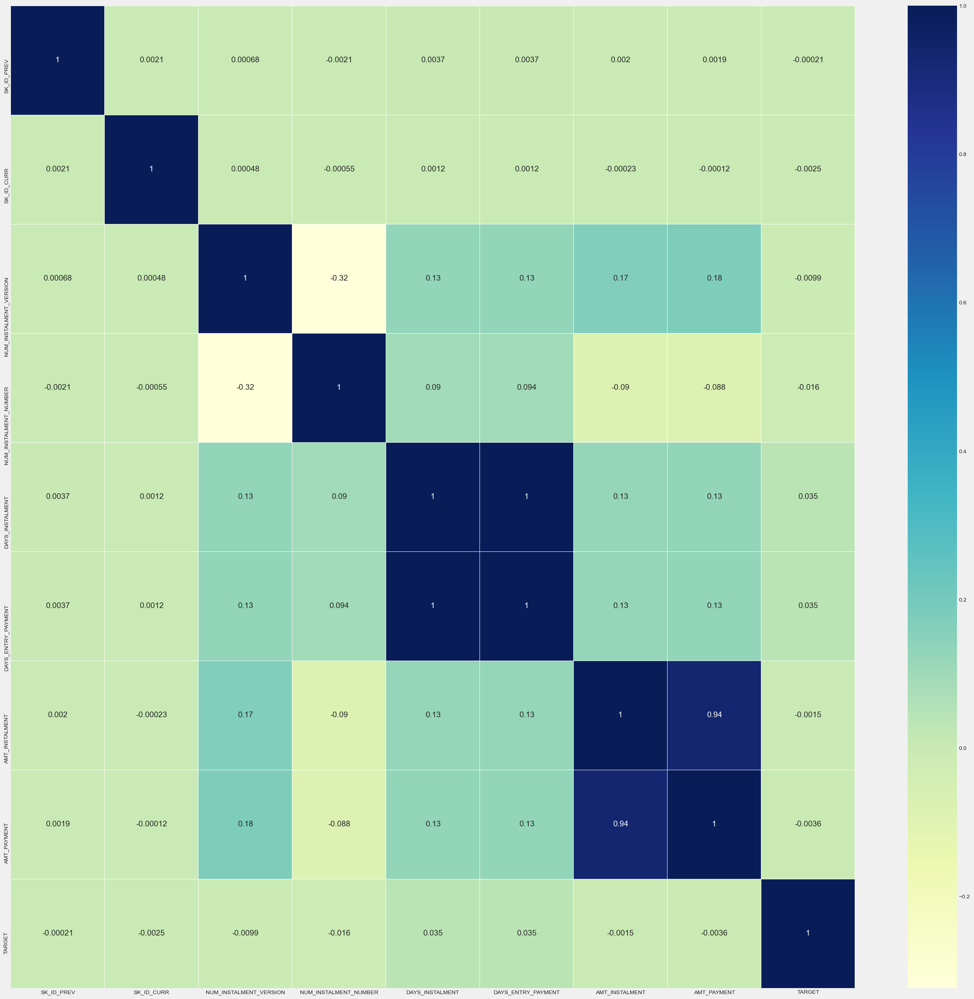

In [174]:
heatmap_correlation(df_i)

## 	6.4. « previous application »

In [175]:
df_p = previous_application
df_p = df_p.merge(train_df[['TARGET','SK_ID_CURR']], on = 'SK_ID_CURR', how = 'left')

In [176]:
target_correlation (df_p).head(10)

TARGET                       1.000000
DAYS_DECISION                0.039903
CNT_PAYMENT                  0.030479
RATE_INTEREST_PRIVILEGED     0.028640
DAYS_LAST_DUE_1ST_VERSION    0.018019
DAYS_LAST_DUE                0.017522
DAYS_TERMINATION             0.016981
SK_ID_PREV                   0.002013
NFLAG_INSURED_ON_APPROVAL    0.000656
AMT_GOODS_PRICE              0.000255
Name: TARGET, dtype: float64

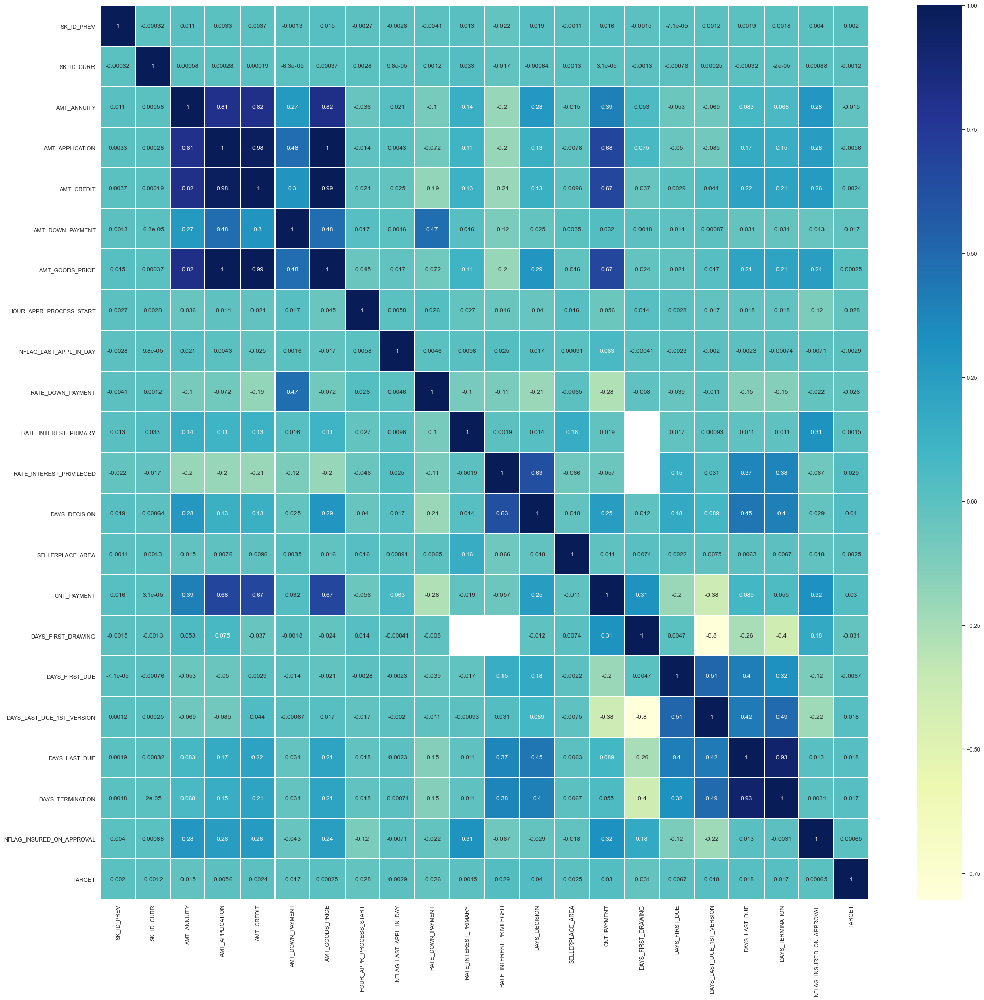

In [299]:
heatmap_correlation(df_p)

## 	6.5. « pos_cash_balance »

- Le table "POS_CASH_balance contient des données mensuelles sur les points de vente précédents ou les prêts en espèces.

In [177]:
df_pos = POS_CASH_balance
df_pos = df_pos.merge(train_df[['TARGET','SK_ID_CURR']], on = 'SK_ID_CURR', how = 'left')

In [178]:
target_correlation (df_pos).head(10)

TARGET                   1.000000
CNT_INSTALMENT_FUTURE    0.021973
MONTHS_BALANCE           0.020148
CNT_INSTALMENT           0.018506
SK_DPD                   0.009866
SK_DPD_DEF               0.008594
SK_ID_PREV              -0.000055
SK_ID_CURR              -0.002247
Name: TARGET, dtype: float64

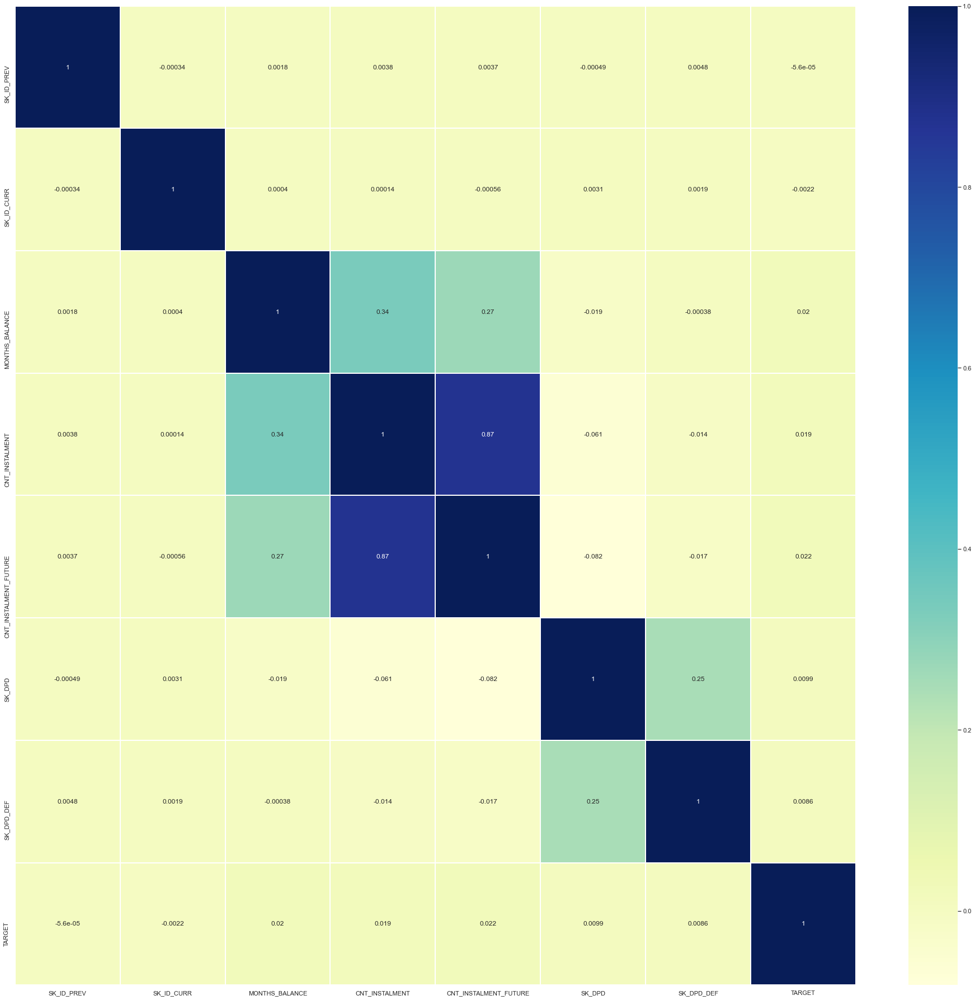

In [302]:
heatmap_correlation(df_pos)

In [179]:
train_df[numerical_variable_list].describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307507.000000,307507.00000,307507.000000,3.075070e+05,3.075070e+05,307495.000000,3.072290e+05,307507.000000,307507.000000,252133.000000,307507.000000,307507.000000,104580.000000,307507.000000,307507.000000,307507.000000,307507.000000,307507.000000,307507.000000,307505.000000,307507.000000,307507.000000,307507.000000,307507.000000,307507.000000,307507.000000,307507.000000,307507.000000,307507.000000,134131.000000,3.068470e+05,246542.000000,151447.000000,127565.000000,157501.000000,103021.000000,92645.000000,143617.000000,152680.000000,154488.000000,98867.000000,124919.000000,97310.000000,153158.000000,93995.000000,137827.000000,151447.000000,127565.000000,157501.000000,103021.000000,92645.000000,143617.000000,152680.000000,154488.000000,98867.000000,124919.000000,97310.000000,153158.000000,93995.000000,137827.000000,151447.000000,127565.000000,157501.000000,103021.000000,92645.000000,143617.000000,152680.000000,154488.000000,98867.000000,124919.000000,97310.000000,153158.000000,93995.000000,137827.000000,159077.000000,306486.000000,306486.000000,306486.000000,306486.000000,269834.000000,307507.000000,307507.000000,307507.000000,307507.000000,307507.000000,307507.000000,307507.000000,307507.000000,307507.000000,307507.000000,307507.000000,307507.000000,307507.000000,307507.00000,307507.000000,307507.000000,307507.000000,307507.000000,307507.000000,307507.000000,265988.000000,265988.000000,265988.000000,265988.000000,265988.000000,265988.000000
mean,278181.527256,0.08073,0.417047,1.687977e+05,5.990286e+05,27108.666786,5.383977e+05,0.020868,-16037.027271,-2384.142254,-4986.131376,-2994.201670,12.061121,0.999997,0.819887,0.199358,0.998133,0.281057,0.056721,2.152658,2.052461,2.031518,12.063394,0.015144,0.050770,0.040659,0.078174,0.230457,0.179557,0.502129,5.143918e-01,0.510856,0.117442,0.088443,0.977735,0.752472,0.044621,0.078943,0.149726,0.226284,0.231897,0.066334,0.100776,0.107400,0.008809,0.028358,0.114232,0.087543,0.977065,0.759637,0.042554,0.074491,0.145194,0.222317,0.228061,0.064958,0.105646,0.105976,0.008077,0.027023,0.117851,0.087955,0.97

# 7. Conclusion  

- **Ce notbook d'Analyse exploratoire nous a permit de :**
  - comprendre l'ensemble de données 
  - avoir une image claire des variables et de leurs  relations avec 'Target'
  - identifier des valeurs manquantes et des valeurs aberrantes

- En se basant sur ce fichier EDA, on va selectionner les variables pertinentes pour la modélisation et construire la base finale des data dans le notebook de "Data preprocessing"

In [180]:
# Exporter le fichier pour l'application en format CSV 
train_df.to_csv(r"C:\Users\faeze\OneDrive\Documents\OC data science\PROJECT\Projet 7\app_train.csv")

# END 